In [ ]:
!pip install geopandas pandas
!pip install matplotlib shapely
!pip install osmnx
!pip install imagecodecs
!pip install numpy
!pip install requests
!pip install scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 71.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 85.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.5/95.5 kB 4.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 44.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Lookin

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon
import numpy as np
import osmnx as ox
import requests
from PIL import Image
from io import BytesIO
from sklearn.cluster import DBSCAN
import math

# CLUSTERING

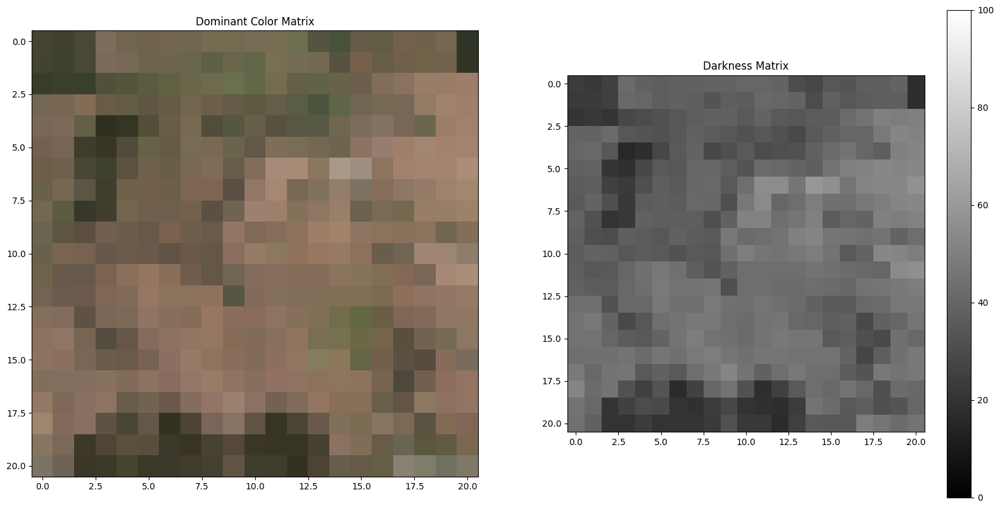

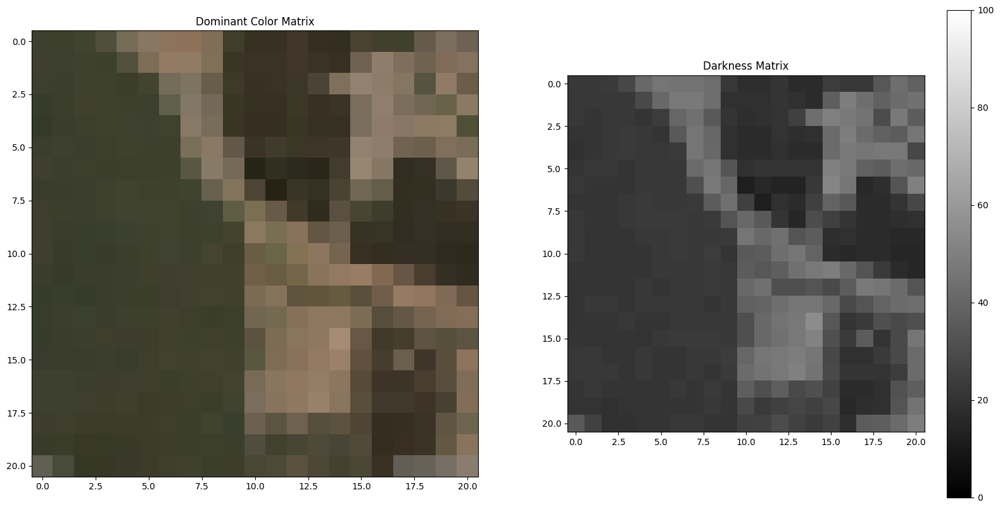

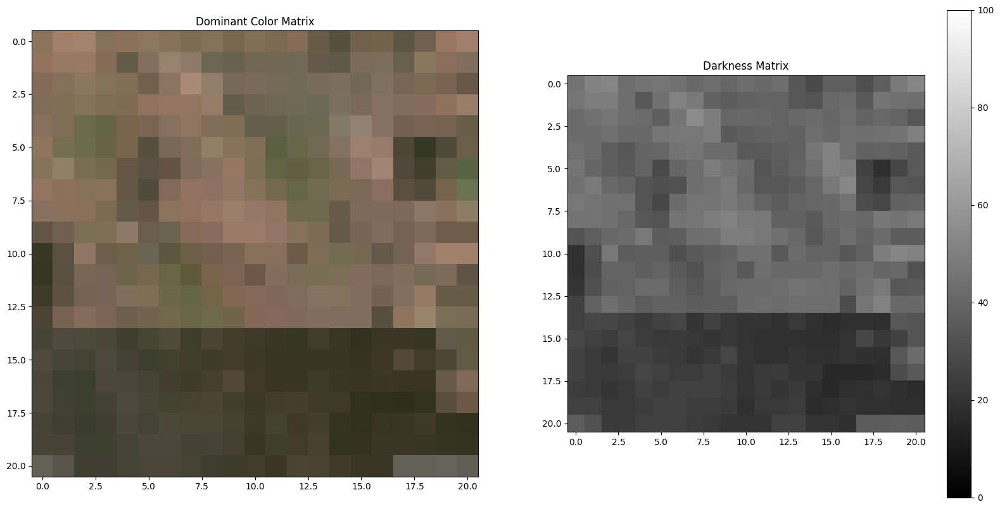

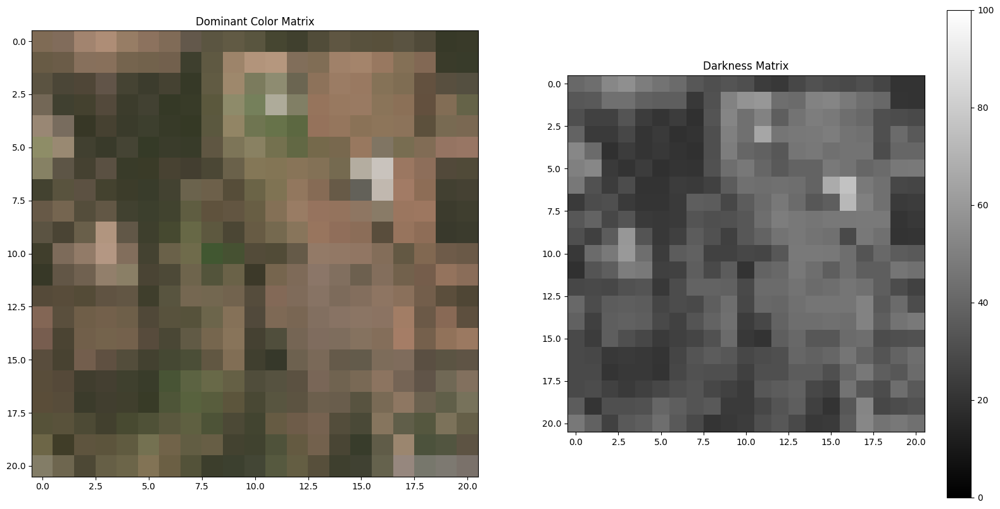

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

def extract_dominant_color(image):
    pixels = np.float32(image.reshape(-1, 3))

    n_colors = 1
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, 0.2)
    _, labels, palette = cv2.kmeans(pixels, n_colors, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    _, counts = np.unique(labels, return_counts=True)
    dominant = palette[np.argmax(counts)]

    return dominant

def darkness_score(color):
    return 100 - int(np.mean(color) * 100 / 255)

def plot_image_matrix(image_folder):
    image_paths = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

    for image_path in image_paths:
        image_bgr = cv2.imread(image_path)

        if image_bgr is None:
            print(f"Failed to load image at {image_path}")
            continue

        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        h, w, _ = image_rgb.shape

        matrix_size = (50, 50)
        num_rows = h // matrix_size[0] + (1 if h % matrix_size[0] else 0)
        num_cols = w // matrix_size[1] + (1 if w % matrix_size[1] else 0)

        color_matrix = np.zeros((num_rows, num_cols, 3), dtype=np.uint8)
        darkness_matrix = np.zeros((num_rows, num_cols), dtype=np.uint8)

        for i in range(0, h, matrix_size[0]):
            for j in range(0, w, matrix_size[1]):
                cell = image_rgb[i:i + matrix_size[0], j:j + matrix_size[1]]
                dominant_color = extract_dominant_color(cell)
                darkness = darkness_score(dominant_color)

                color_matrix[i // matrix_size[0], j // matrix_size[1]] = dominant_color
                darkness_matrix[i // matrix_size[0], j // matrix_size[1]] = 100 - darkness

        fig, axs = plt.subplots(1, 2, figsize=(20, 10))

        axs[0].imshow(color_matrix)
        axs[0].set_title('Dominant Color Matrix')

        im = axs[1].imshow(darkness_matrix, cmap='gray', vmin=0, vmax=100)
        axs[1].set_title('Darkness Matrix')
        fig.colorbar(im, ax=axs[1])

        plt.show()

# Replace 'image_folder' with the path to the folder containing your images
image_folder = "/content/drive/MyDrive/IAAC_TEST"
plot_image_matrix(image_folder)


In [ ]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib.cm as cm

In [ ]:
import networkx as nx

def create_weighted_graph(matrix):
    graph = nx.DiGraph()
    num_rows, num_cols = matrix.shape

    for i in range(num_rows):
        for j in range(num_cols):
            node_name = f"{i}_{j}"
            graph.add_node(node_name, pos=(j, -i), weight=matrix[i, j])

            for x_offset, y_offset in [(1, 0), (0, 1), (-1, 0), (0, -1)]:
                neighbor_i, neighbor_j = i + y_offset, j + x_offset

                if 0 <= neighbor_i < num_rows and 0 <= neighbor_j < num_cols:
                    neighbor_name = f"{neighbor_i}_{neighbor_j}"
                    graph.add_edge(node_name, neighbor_name, weight=matrix[neighbor_i, neighbor_j])

    return graph

def plot_graph(graph):
    node_positions = nx.get_node_attributes(graph, 'pos')
    weights = nx.get_node_attributes(graph, 'weight')

    fig, ax = plt.subplots(figsize=(10, 10))
    nodes = nx.draw_networkx_nodes(graph, node_positions, node_size=200, node_color=list(weights.values()), cmap=plt.cm.gray, vmin=0, vmax=10)
    nx.draw_networkx_edges(graph, node_positions, edge_color='gray', width=1)

    # Add colorbar for node colors
    sm = ScalarMappable(cmap=plt.cm.gray, norm=Normalize(vmin=0, vmax=10))
    sm.set_array([])
    plt.colorbar(sm, ax=ax, label='Node Darkness')

    ax.set_title('Weighted Graph')
    plt.show()

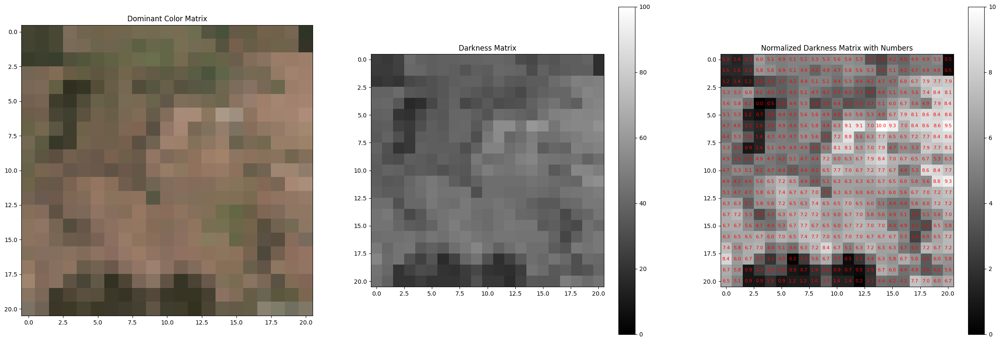

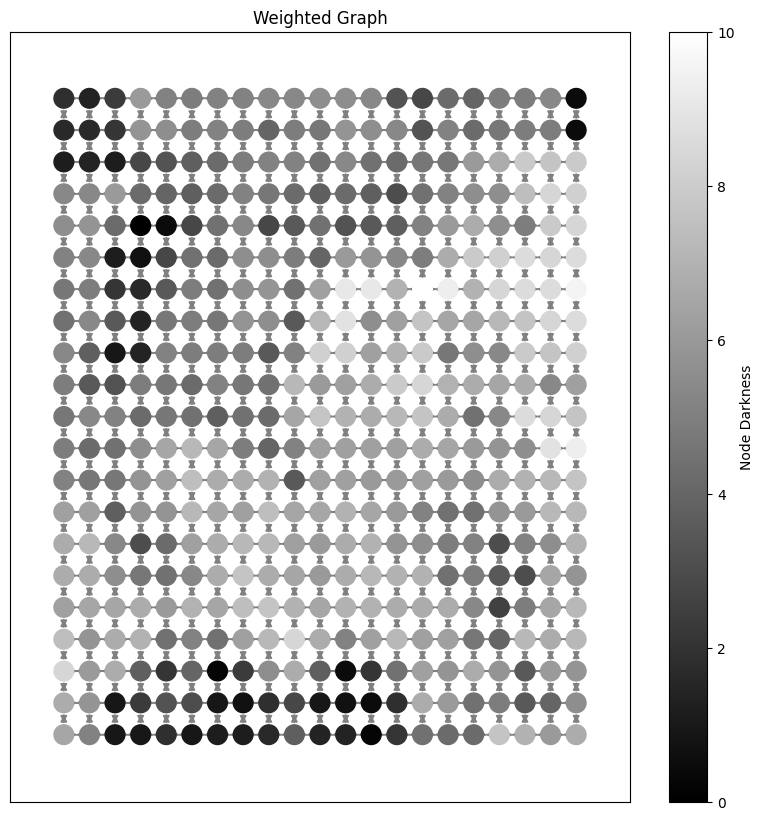

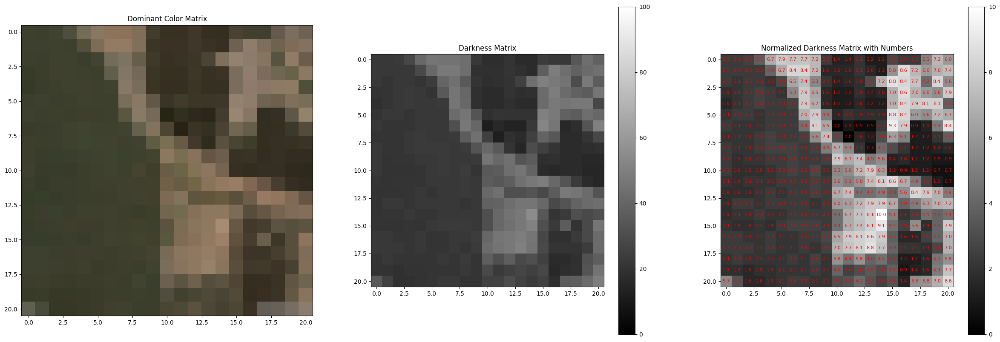

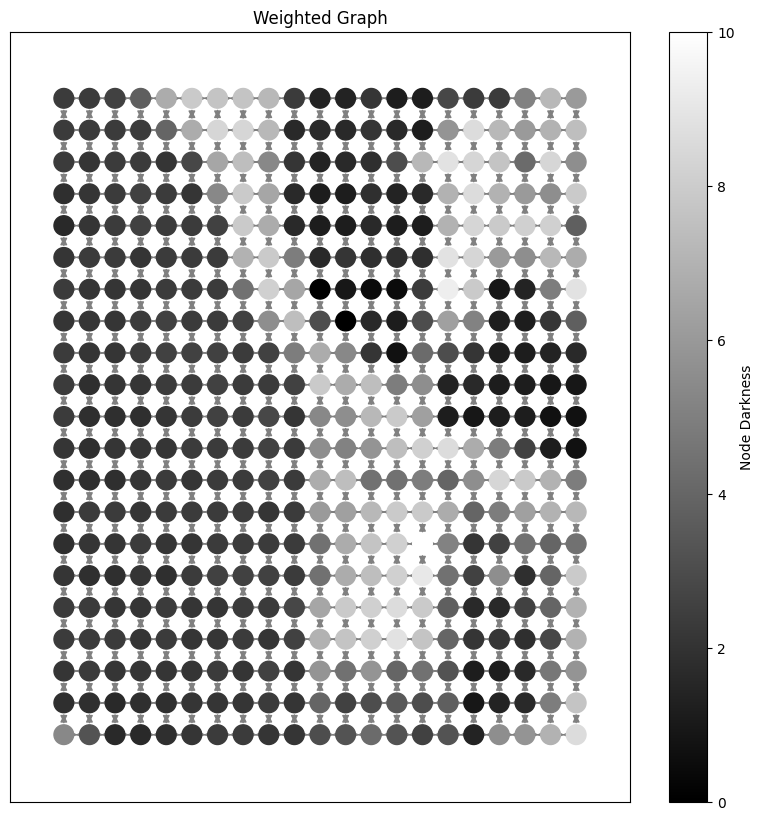

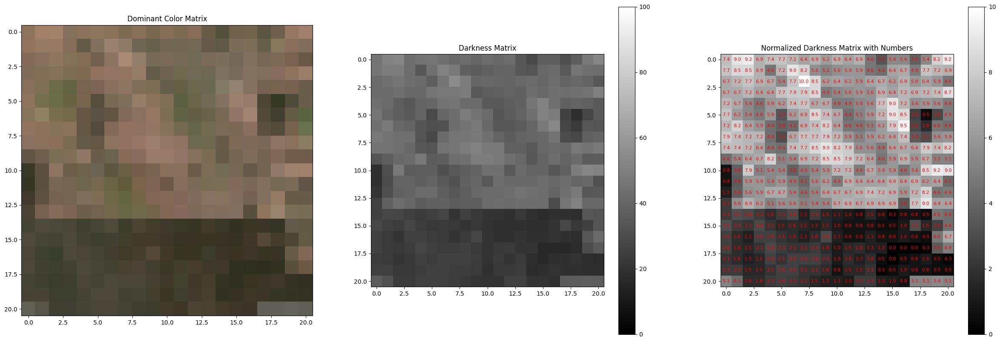

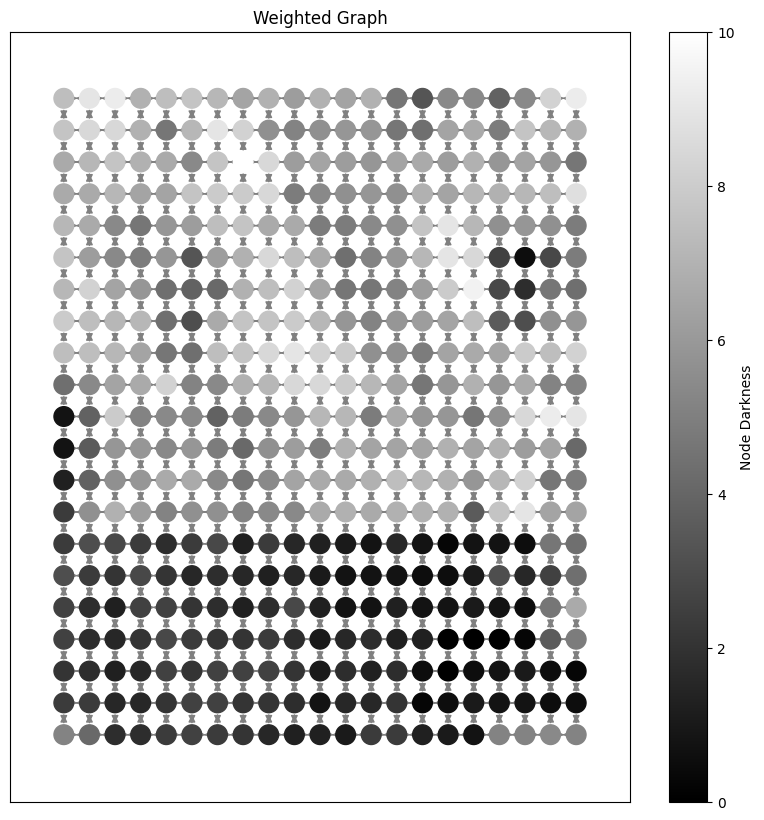

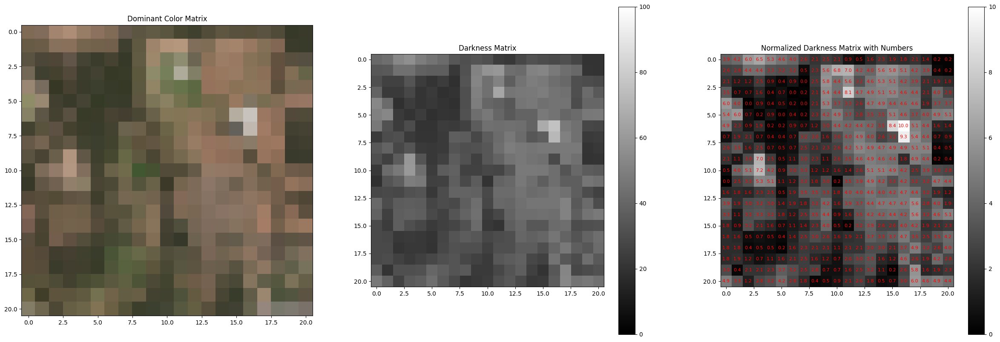

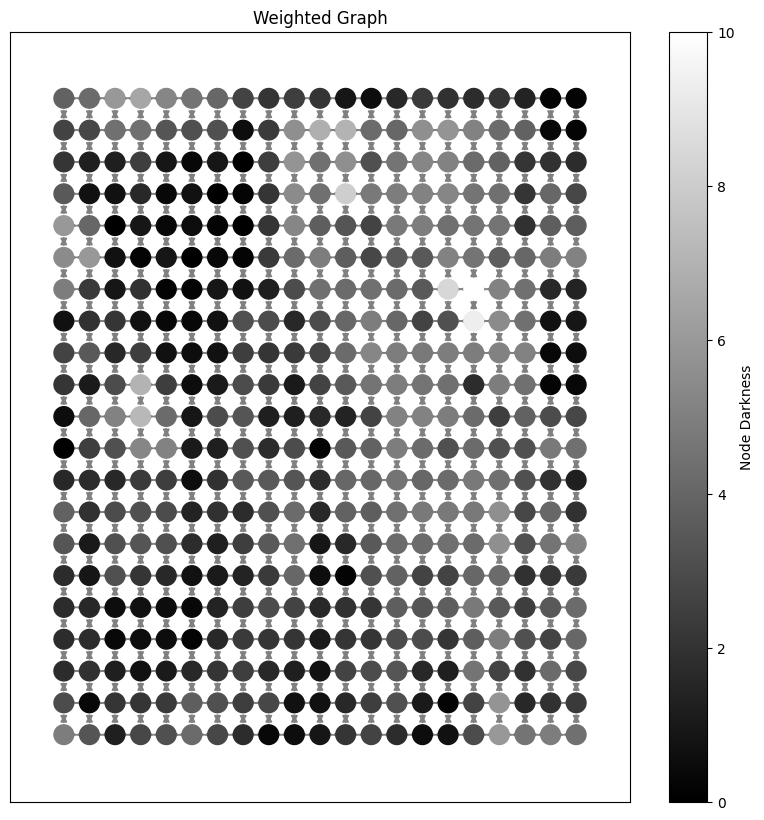

In [ ]:
def plot_image_matrix(image_folder):
    image_paths = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

    graphs = []  # List to store the graphs
    normalized_darkness_matrices = []  # List to store the normalized darkness matrices

    for image_path in image_paths:
        image_bgr = cv2.imread(image_path)

        if image_bgr is None:
            print(f"Failed to load image at {image_path}")
            continue

        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        h, w, _ = image_rgb.shape

        matrix_size = (50, 50)
        num_rows = h // matrix_size[0] + (1 if h % matrix_size[0] else 0)
        num_cols = w // matrix_size[1] + (1 if w % matrix_size[1] else 0)

        color_matrix = np.zeros((num_rows, num_cols, 3), dtype=np.uint8)
        darkness_matrix = np.zeros((num_rows, num_cols), dtype=np.uint8)

        for i in range(0, h, matrix_size[0]):
            for j in range(0, w, matrix_size[1]):
                cell = image_rgb[i:i + matrix_size[0], j:j + matrix_size[1]]
                dominant_color = extract_dominant_color(cell)
                darkness = darkness_score(dominant_color)

                color_matrix[i // matrix_size[0], j // matrix_size[1]] = dominant_color
                darkness_matrix[i // matrix_size[0], j // matrix_size[1]] = 100 - darkness

        fig, axs = plt.subplots(1, 3, figsize=(30, 10))

        axs[0].imshow(color_matrix)
        axs[0].set_title('Dominant Color Matrix')

        im = axs[1].imshow(darkness_matrix, cmap='gray', vmin=0, vmax=100)
        axs[1].set_title('Darkness Matrix')
        fig.colorbar(im, ax=axs[1])

        # Normalize darkness_matrix to range [0, 10]
        normalized_darkness_matrix = np.interp(darkness_matrix, (darkness_matrix.min(), darkness_matrix.max()), (0, 10))
        normalized_darkness_matrices.append(normalized_darkness_matrix)  # Append the normalized darkness matrix to the list
        im2 = axs[2].imshow(normalized_darkness_matrix, cmap='gray', vmin=0, vmax=10)
        axs[2].set_title('Normalized Darkness Matrix with Numbers')
        fig.colorbar(im2, ax=axs[2])

        # Add numbers to the 'Normalized Darkness Matrix with Numbers' plot
        for i in range(num_rows):
            for j in range(num_cols):
                axs[2].annotate(f"{normalized_darkness_matrix[i, j]:.1f}", (j, i),
                                ha='center', va='center', color='red', fontsize=8)

        plt.show()

        weighted_graph = create_weighted_graph(normalized_darkness_matrix)
        graphs.append(weighted_graph)  # Append the graph to the list

        plot_graph(weighted_graph)

    return graphs  # Return the list of graphs and the normalized darkness matrices

# Replace 'image_folder' with the path to the folder containing your images
image_folder = "/content/drive/MyDrive/IAAC_TEST"
graphs = plot_image_matrix(image_folder)


In [ ]:
!pip install scikit-image


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


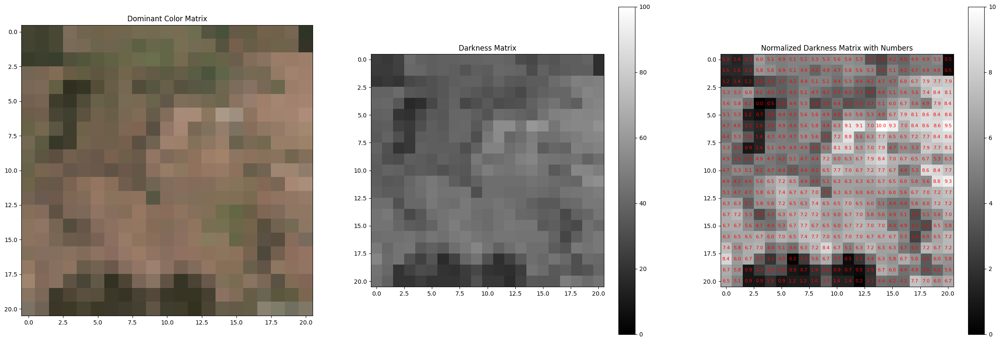

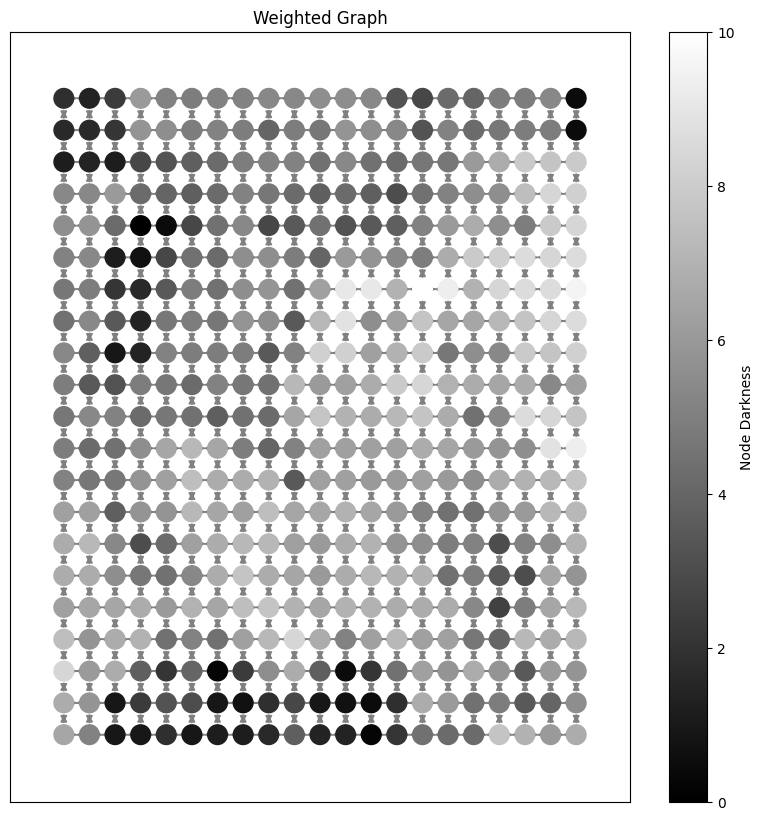

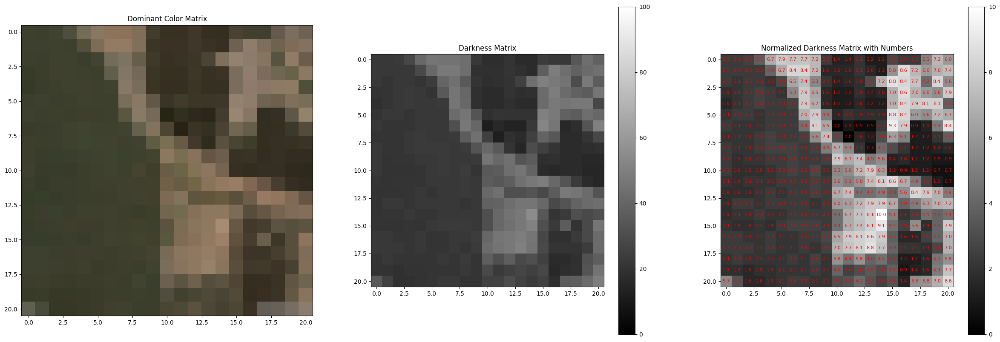

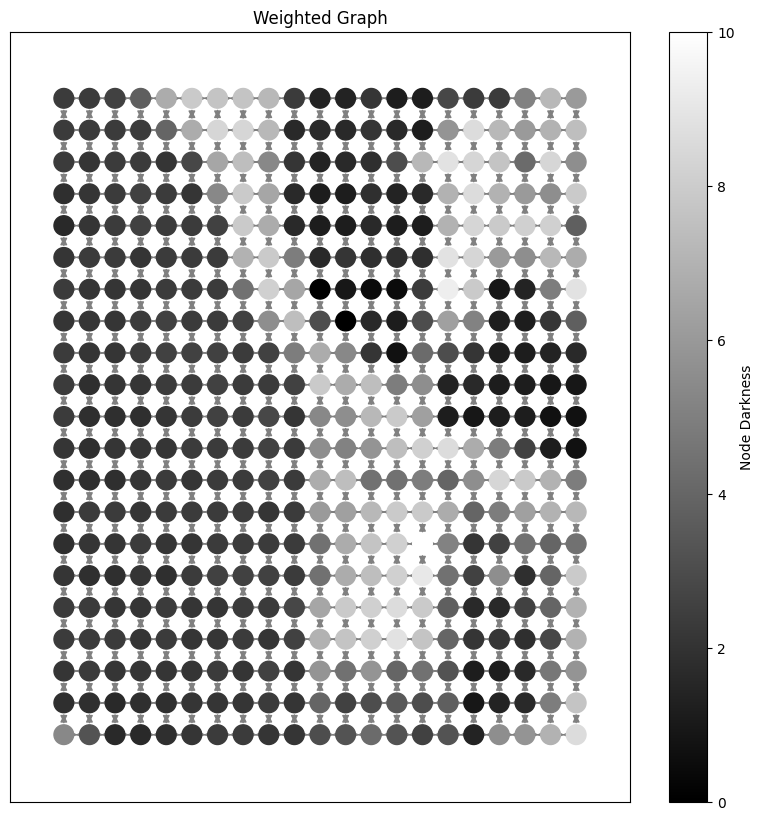

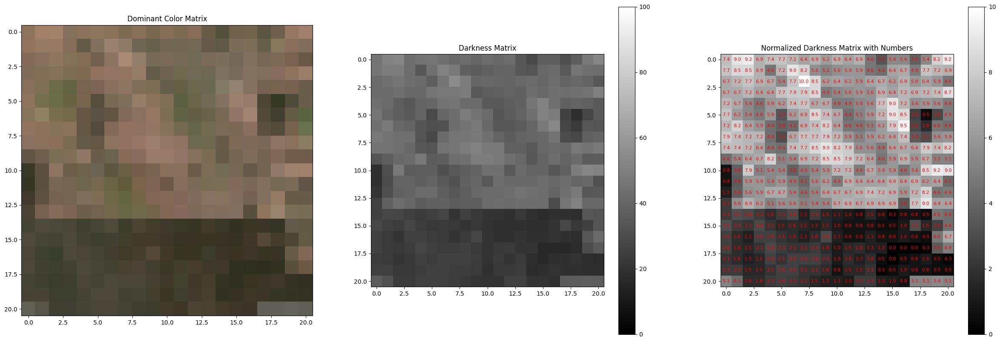

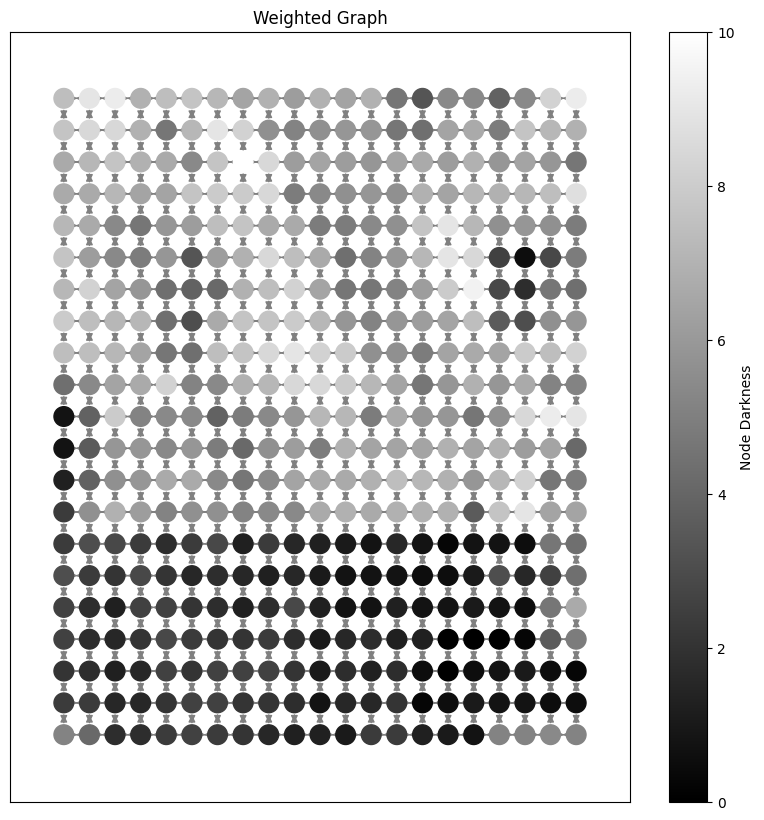

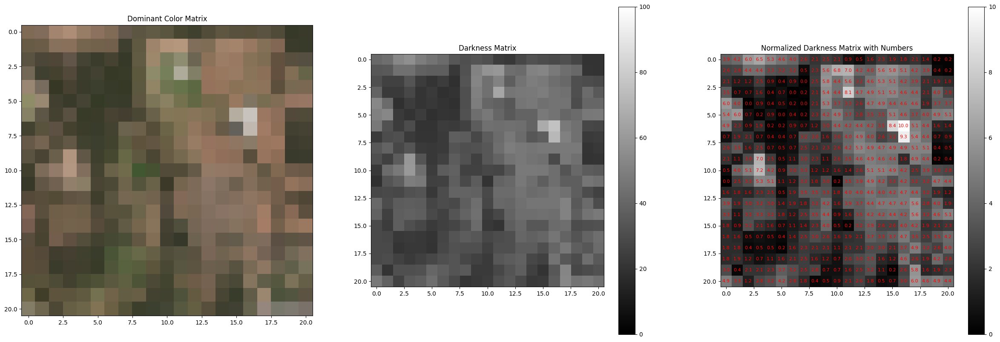

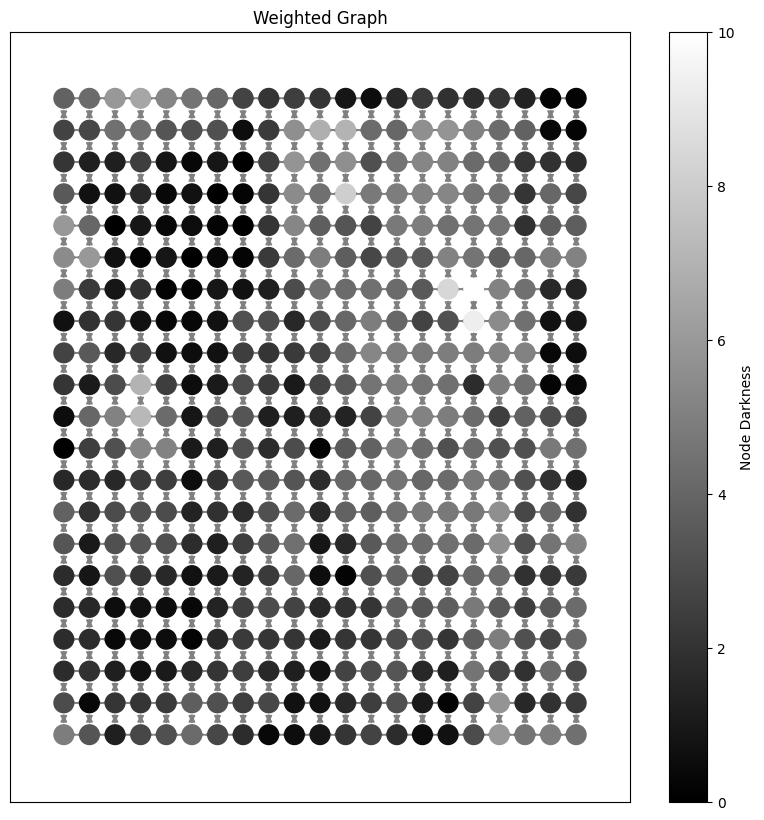

In [ ]:
image_folder = "/content/drive/MyDrive/IAAC_TEST"
my_graphs = plot_image_matrix(image_folder)


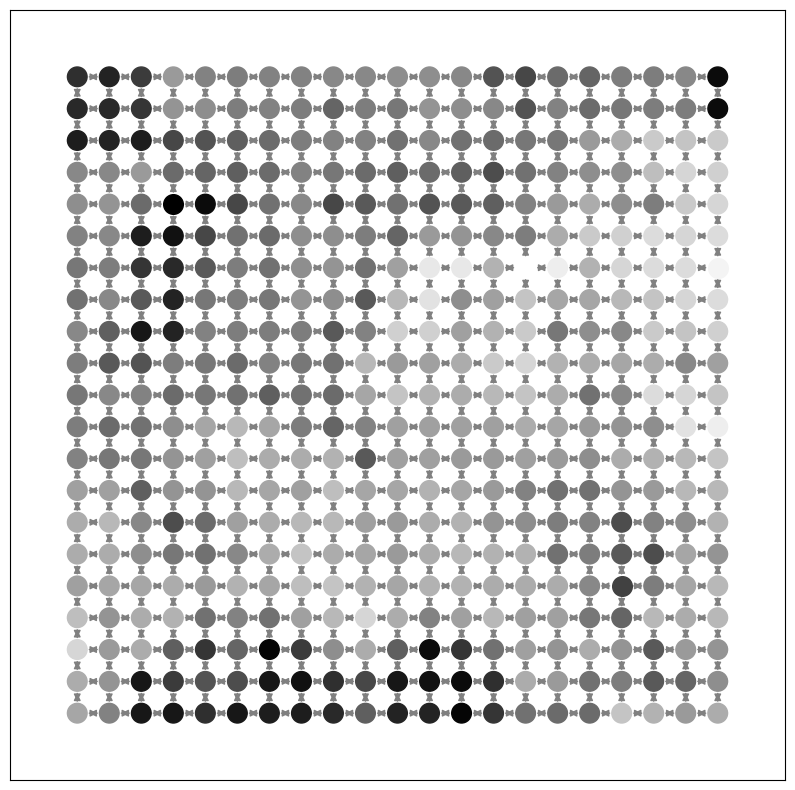

        color  tree_density
0    1.860465      0.907029
1    1.395349      1.360544
2    1.627907      0.907029
3    2.325581      0.680272
4    6.046512      4.308390
5    2.093023      1.133787
6    5.116279      5.215420
7    5.813953      4.081633
8    4.883721      5.895692
9    5.581395      4.988662
10   5.348837      4.535147
11   3.953488      1.814059
12   4.651163      3.854875
13   3.255814      1.360544
14   2.790698      1.360544
15   4.186047      3.854875
16   0.465116      1.133787
17   1.162791      1.133787
18   3.720930      2.494331
19   4.418605      5.215420
20   6.744186      7.482993
21   7.906977      1.587302
22   7.674419      2.494331
23   3.023256      1.133787
24   7.441860      1.133787
25   8.372093      2.040816
26   8.139535      1.133787
27   0.000000      0.226757
28   3.488372      2.494331
29   0.697674      0.680272
30   8.604651      1.360544
31   6.279070      5.442177
32   9.069767      0.453515
33   6.976744      4.081633
34  10.000000      0

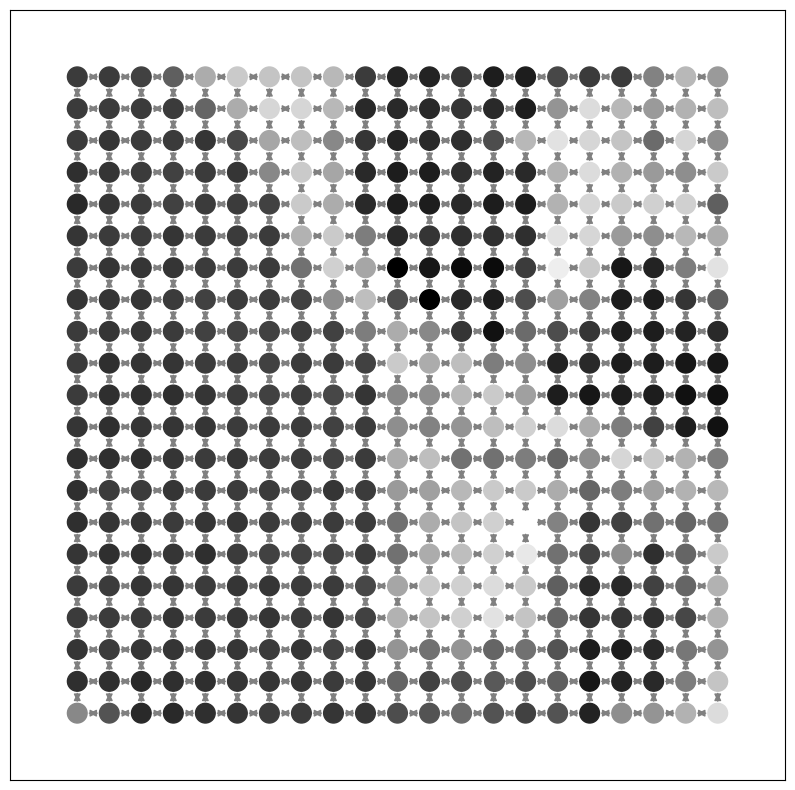

        color  tree_density
0    2.325581     17.687075
1    2.558140      5.895692
2    3.720930      1.133787
3    6.744186      2.494331
4    7.906977      3.401361
5    3.953488      2.040816
6    7.674419      1.587302
7    8.372093      1.587302
8    7.209302      2.040816
9    1.395349      2.040816
10   1.627907      4.761905
11   2.093023     14.739229
12   1.162791      4.988662
13   2.790698      1.133787
14   5.813953      1.360544
15   8.604651      1.133787
16   5.116279      0.907029
17   6.046512      1.133787
18   6.976744      2.494331
19   7.441860      1.587302
20   6.511628      0.907029
21   5.348837      1.133787
22   1.860465      5.895692
23   3.023256      1.587302
24   8.837209      0.907029
25   4.186047      0.680272
26   5.581395      2.267574
27   8.139535      1.814059
28   4.883721      2.040816
29   4.418605      2.267574
30   0.000000      0.453515
31   0.930233      1.360544
32   0.465116      0.453515
33   9.302326      0.226757
34   6.279070      0

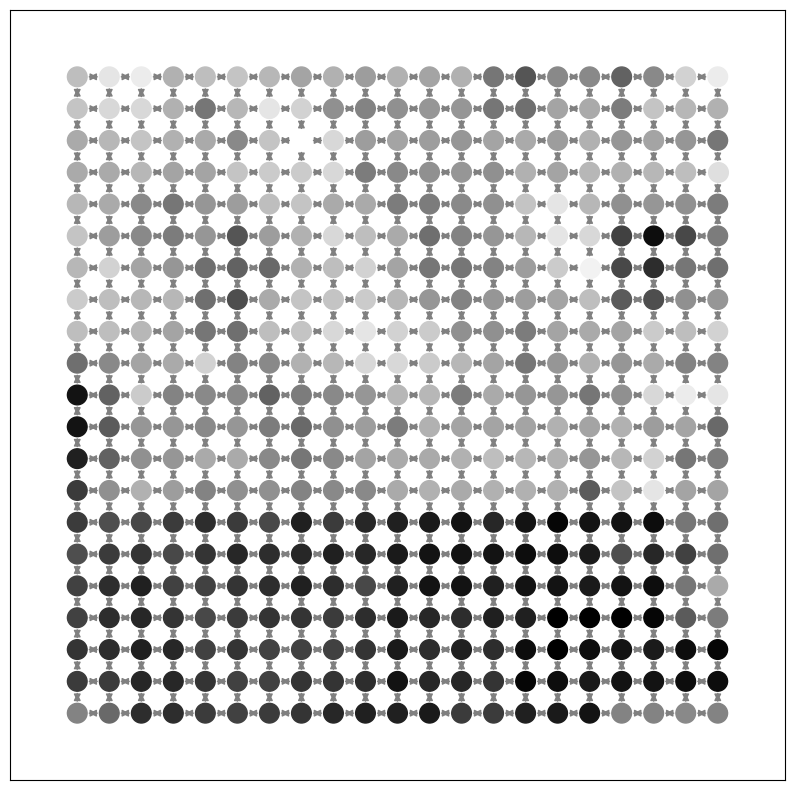

        color  tree_density
0    7.435897      2.947846
1    8.974359      1.587302
2    7.692308      2.947846
3    9.230769      0.680272
4    8.461538      2.267574
5    6.923077      5.442177
6    4.615385      3.401361
7    7.179487      4.761905
8    6.410256      5.668934
9    8.205128      1.814059
10   6.153846      2.721088
11   5.641026      3.628118
12   5.128205      3.174603
13   5.897436      5.442177
14   3.333333      0.453515
15   5.384615      4.308390
16   4.358974      2.040816
17   3.846154      1.133787
18   6.666667      4.988662
19   4.871795      3.174603
20  10.000000      0.226757
21   7.948718      2.040816
22   8.717949      0.226757
23   2.564103      2.947846
24   0.512821      2.494331
25   2.820513      1.587302
26   4.102564      0.907029
27   9.487179      0.226757
28   1.794872      3.401361
29   3.076923      1.133787
30   3.589744      0.907029
31   0.769231      4.308390
32   1.282051      3.401361
33   2.307692      3.174603
34   1.538462      3

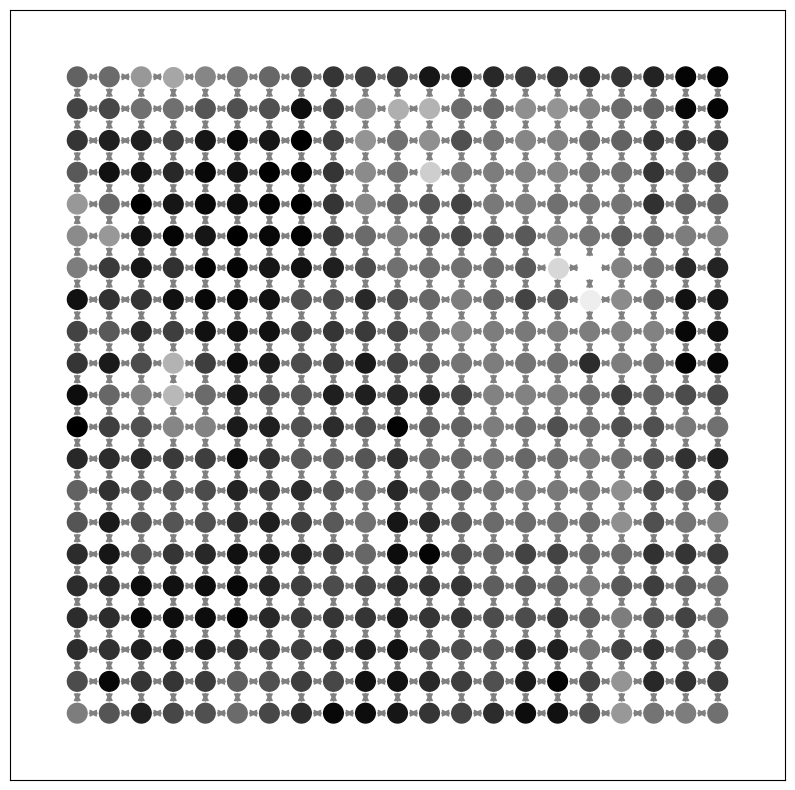

        color  tree_density
0    3.859649      1.814059
1    4.210526      4.761905
2    2.631579      3.628118
3    5.964912      0.907029
4    2.807018      2.040816
5    6.491228      0.226757
6    4.385965      4.081633
7    5.263158      1.360544
8    4.561404      2.721088
9    3.333333      2.040816
10   4.035088      3.401361
11   3.157895      4.988662
12   2.105263      5.215420
13   0.526316      3.401361
14   2.456140      3.401361
15   2.280702      2.721088
16   5.614035      1.133787
17   0.877193      2.721088
18   6.842105      0.226757
19   7.017544      0.453515
20   1.578947      4.308390
21   1.929825      3.401361
22   1.754386      3.401361
23   5.789474      0.680272
24   5.087719      2.947846
25   1.403509      1.360544
26   0.175439      3.174603
27   0.350877      2.947846
28   1.228070      2.721088
29   0.000000      1.360544
30   3.508772      2.947846
31   0.701754      4.081633
32   5.438596      0.680272
33   8.070175      0.226757
34   4.736842      2

In [ ]:
import pandas as pd

def cluster_nodes_by_color(graph):
    weights = nx.get_node_attributes(graph, 'weight')
    clusters = {}

    for node, weight in weights.items():
        if weight not in clusters:
            clusters[weight] = [node]
        else:
            clusters[weight].append(node)

    return clusters

def calculate_tree_density(graph):
    clusters = cluster_nodes_by_color(graph)
    total_nodes = graph.number_of_nodes()
    tree_density_data = []

    for weight, nodes in clusters.items():
        percentage = len(nodes) / total_nodes * 100
        tree_density_data.append({'color': weight, 'tree_density': percentage})

    df_tree_density = pd.DataFrame(tree_density_data)

    return df_tree_density

def plot_clustered_graph(graph, clusters):
    node_positions = nx.get_node_attributes(graph, 'pos')

    fig, ax = plt.subplots(figsize=(10, 10))

    for color, nodes in clusters.items():
        node_colors = [color] * len(nodes)
        nx.draw_networkx_nodes(graph, node_positions, nodelist=nodes, node_color=node_colors, node_size=200, cmap=plt.cm.gray, vmin=0, vmax=10)

    nx.draw_networkx_edges(graph, node_positions, edge_color='gray', width=1)
    plt.show()

# Replace with the list of graphs obtained from the previous script
graphs = my_graphs  # replace 'my_graphs' with your list of graphs

for graph in graphs:
    clusters = cluster_nodes_by_color(graph)
    plot_clustered_graph(graph, clusters)

    df_tree_density = calculate_tree_density(graph)
    print(df_tree_density)


In [ ]:
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib.cm as cm

Graph 1:


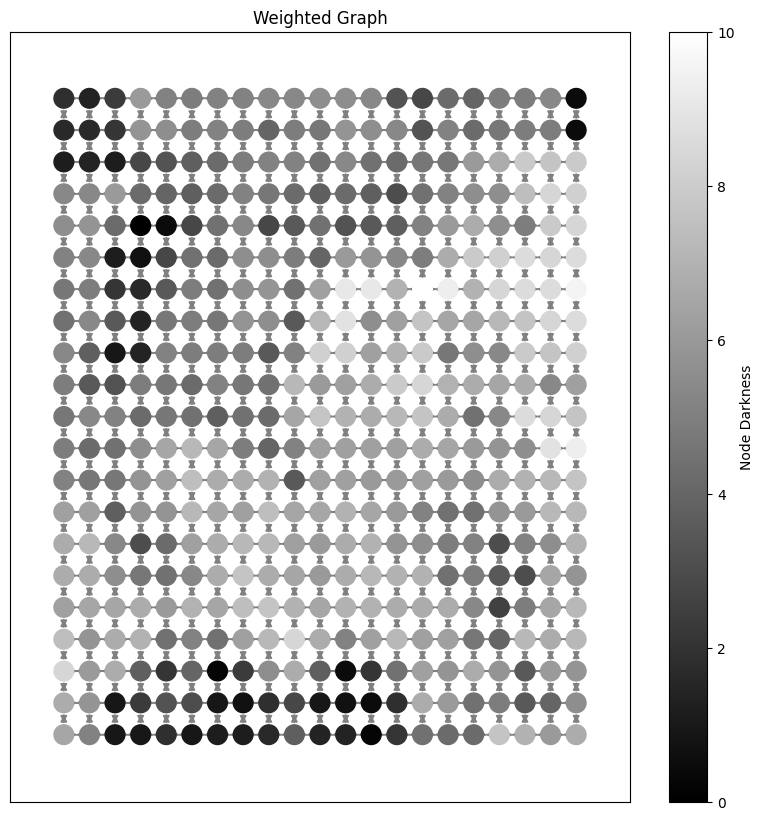

Graph 2:


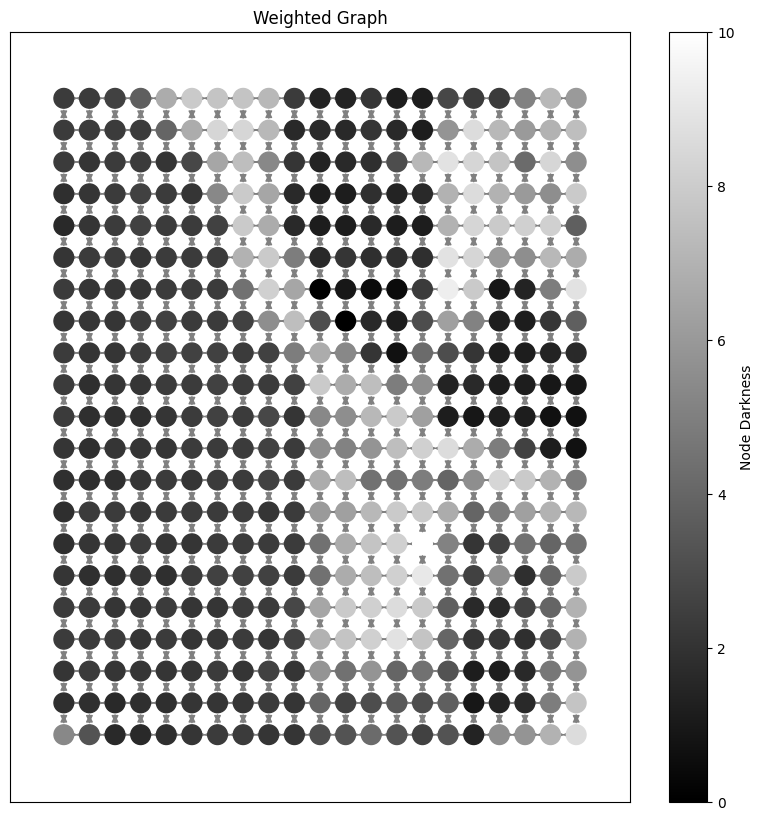

Graph 3:


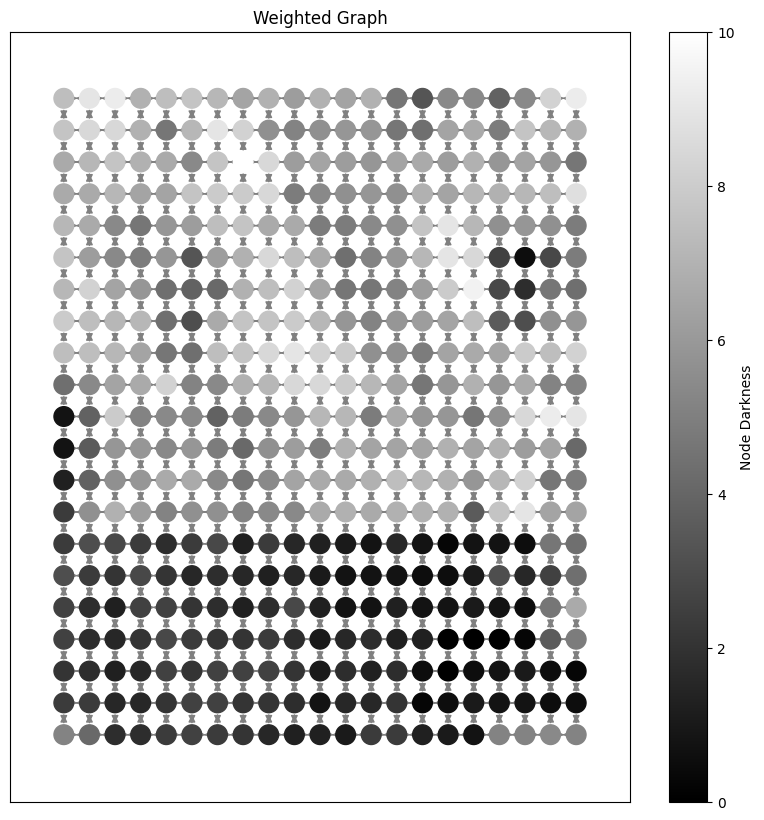

Graph 4:


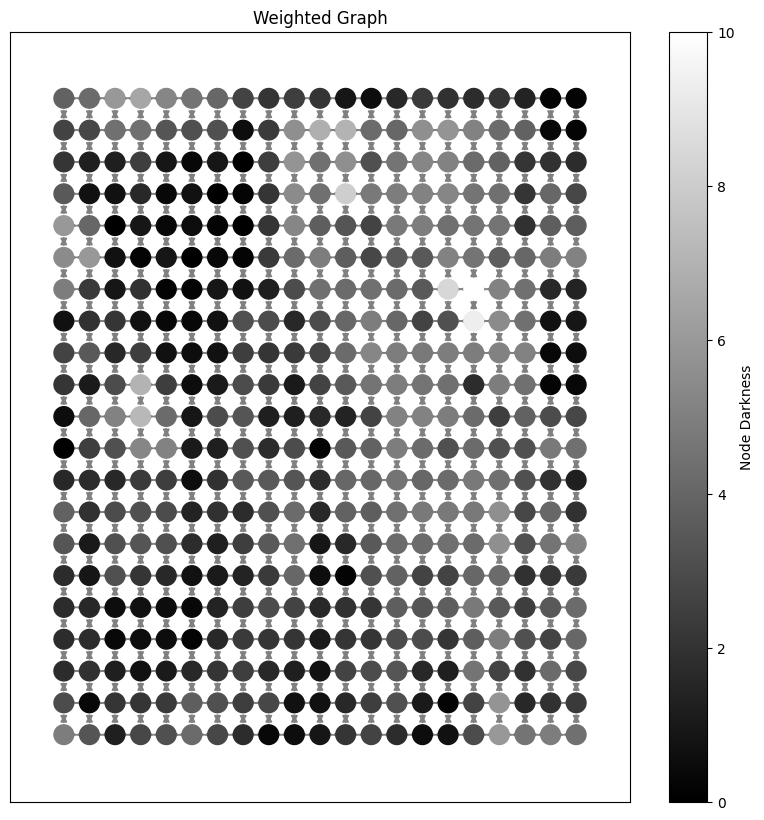

In [ ]:
for i, graph in enumerate(my_graphs):
    print(f"Graph {i+1}:")
    plot_graph(graph)


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import numpy as np

def cluster_and_plot_graph(graph):
    node_positions = nx.get_node_attributes(graph, 'pos')
    weights = nx.get_node_attributes(graph, 'weight')

    # Define thresholds
    thresholds = [0, 2, 4, 6, 8, 10]

    # Assign labels based on thresholds
    labels = np.digitize(list(weights.values()), bins=thresholds, right=True)

    fig, ax = plt.subplots(figsize=(10, 10))

    # Create a scatter plot of the nodes using their color attribute and assign the cluster labels as colors
    plt.scatter(*zip(*node_positions.values()), c=labels, cmap=plt.cm.viridis, s=200)

    # Draw the edges
    nx.draw_networkx_edges(graph, node_positions, edge_color='gray', width=1)

    # Add colorbar for node colors
    sm = cm.ScalarMappable(cmap=plt.cm.viridis, norm=Normalize(vmin=min(labels), vmax=max(labels)))
    sm.set_array([])
    plt.colorbar(sm, ax=ax, label='Darkness Cluster ID')

    ax.set_title('Clustered Graph')
    plt.show()


Graph 1:


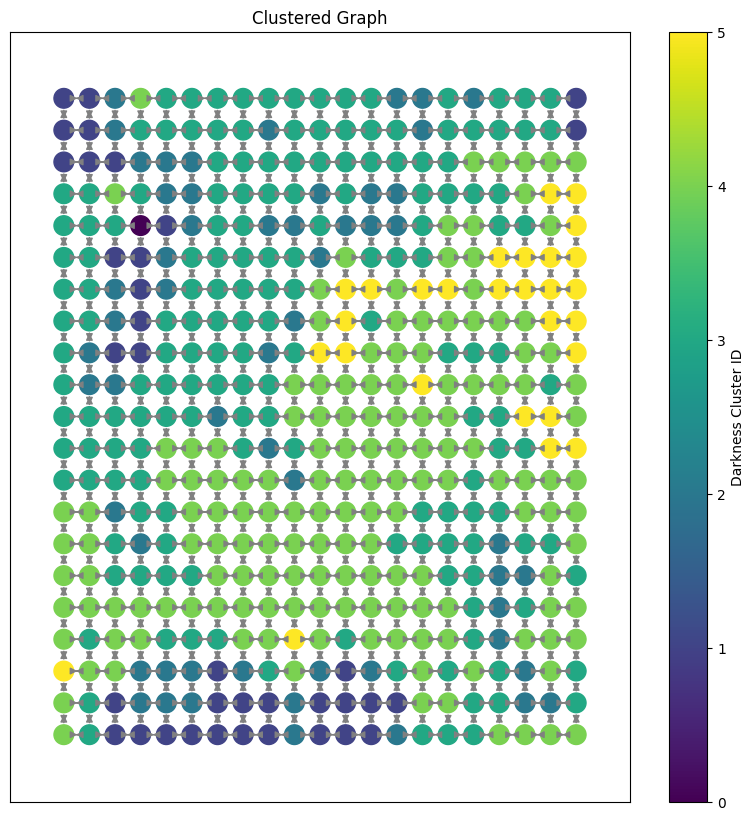

Graph 2:


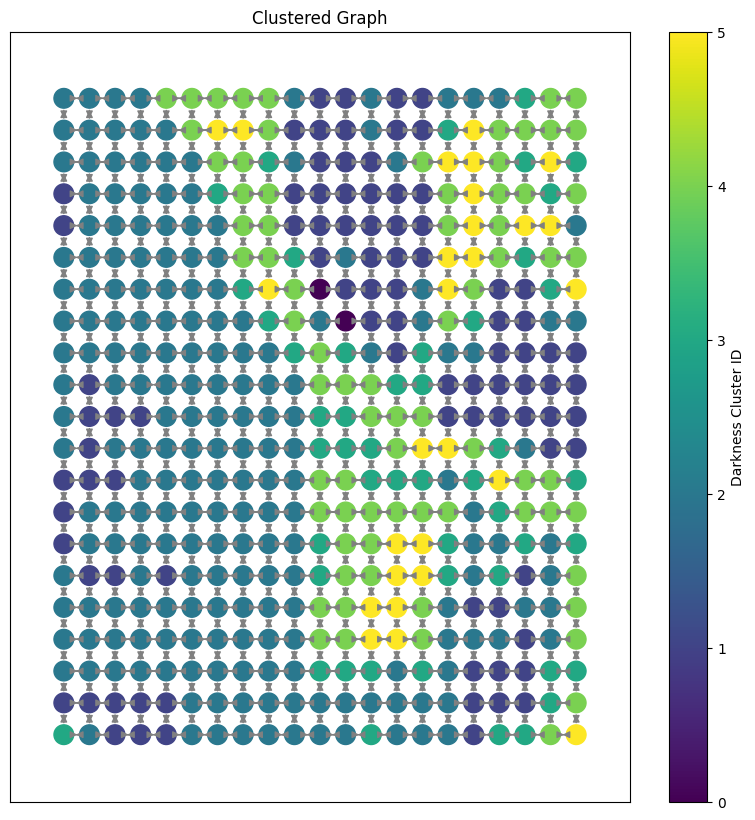

Graph 3:


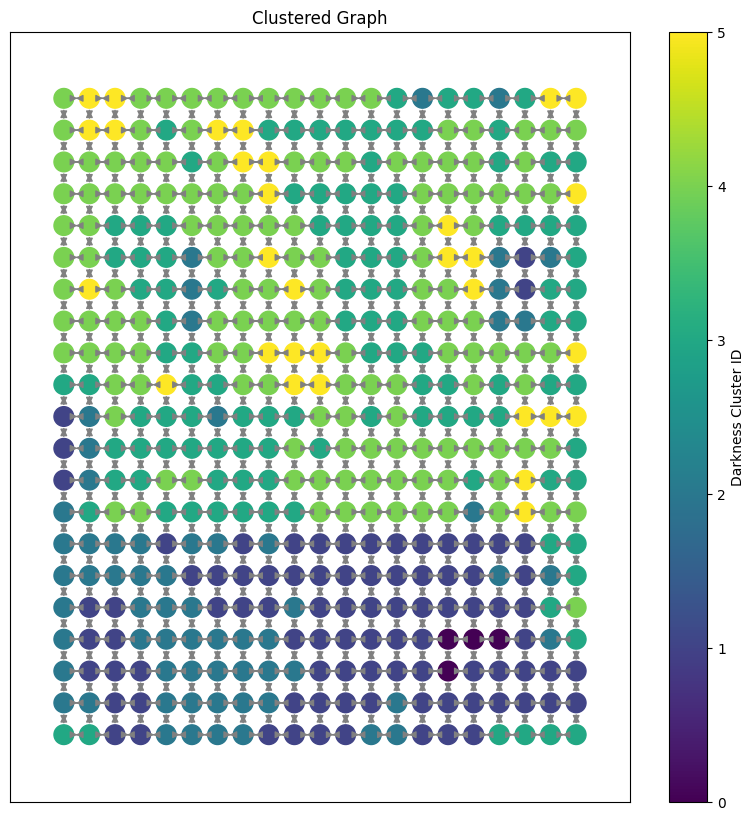

Graph 4:


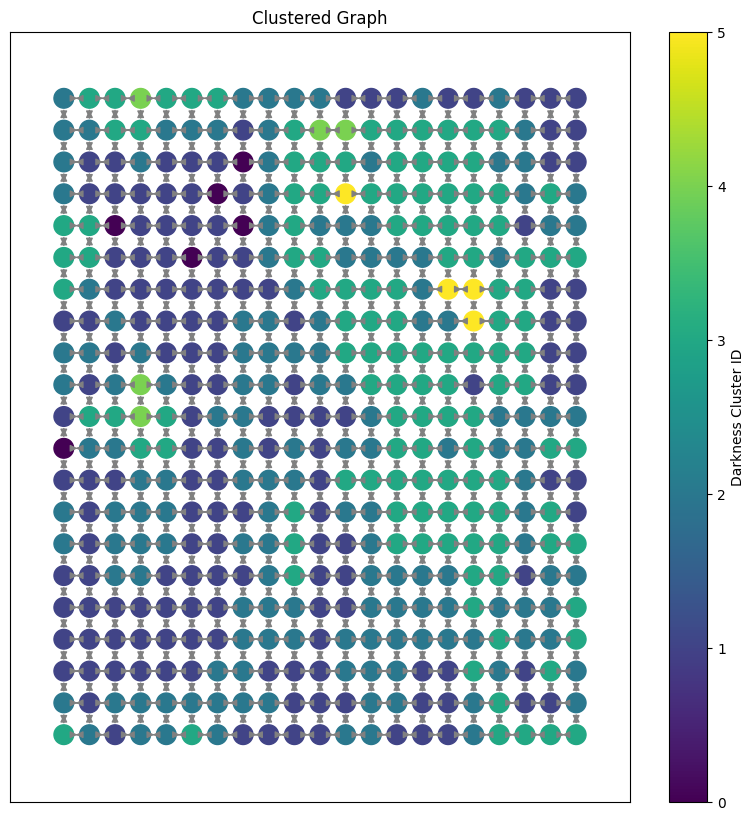

In [ ]:
for i, graph in enumerate(my_graphs):
    print(f"Graph {i+1}:")
    cluster_and_plot_graph(graph)


Graph 1:


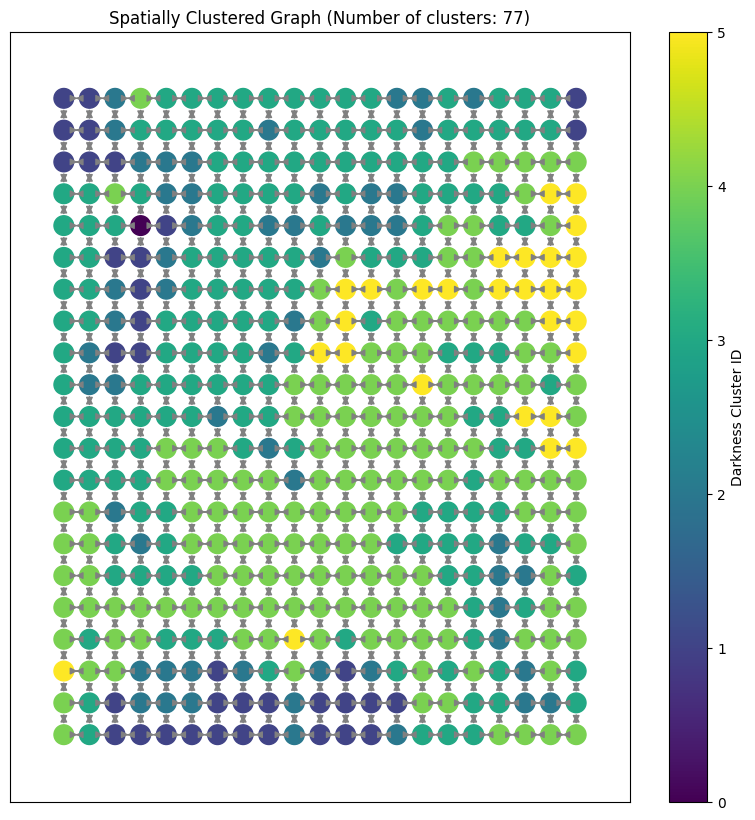

Graph 2:


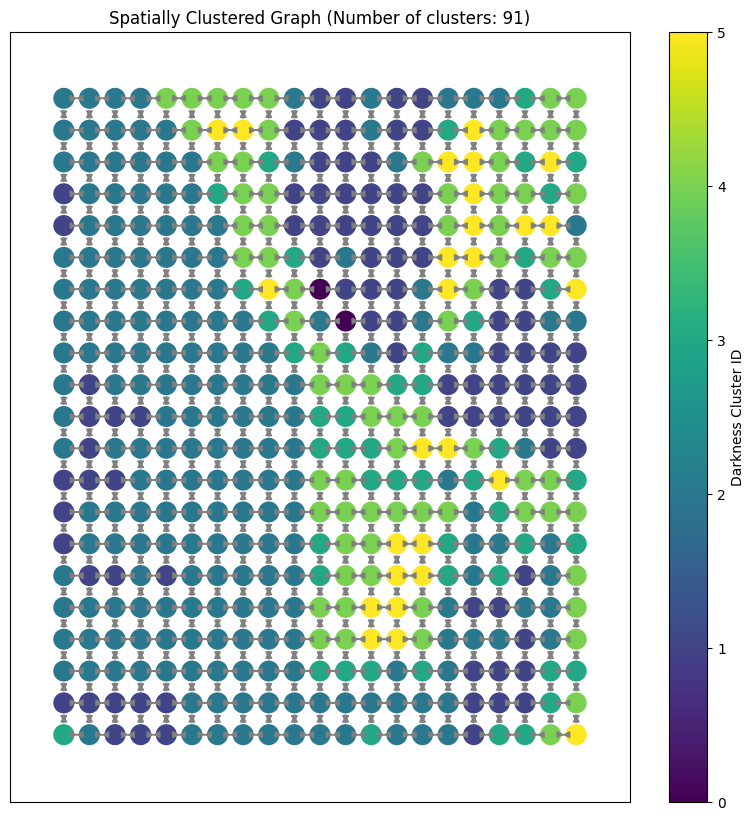

Graph 3:


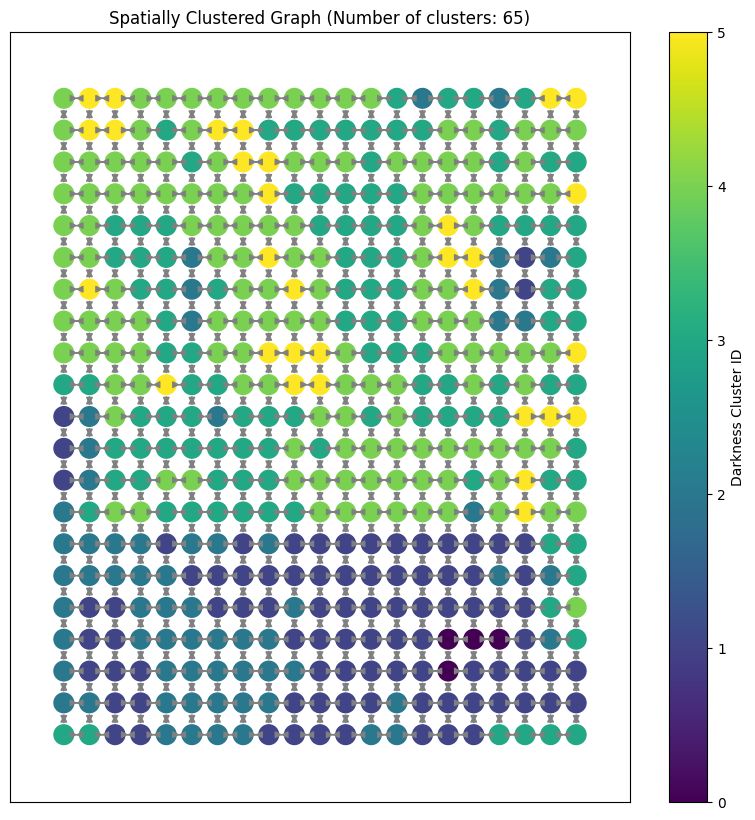

Graph 4:


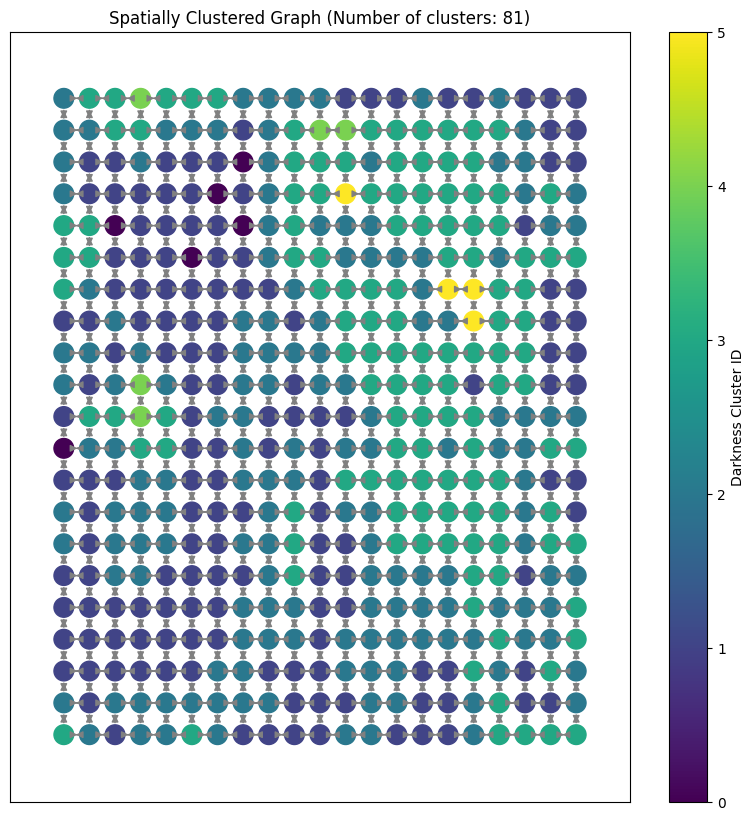

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn import preprocessing

def spatial_cluster_and_plot_graph(graph):
    node_positions = nx.get_node_attributes(graph, 'pos')
    weights = nx.get_node_attributes(graph, 'weight')

    thresholds = [0, 2, 4, 6, 8, 10]
    labels = np.digitize(list(weights.values()), bins=thresholds, right=True)

    fig, ax = plt.subplots(figsize=(10, 10))

    # Store spatial cluster labels here
    spatial_labels = []

    # For each weight-based cluster
    for cluster_id in set(labels):

        # Get positions of nodes in the cluster
        cluster_positions = [node_positions[node] for node, weight in weights.items() if np.digitize(weight, bins=thresholds, right=True) == cluster_id]

        # Perform DBSCAN spatial clustering
        dbscan = DBSCAN(eps=1, min_samples=1)  # You may need to adjust the 'eps' parameter
        dbscan.fit(cluster_positions)

        # Add spatial cluster labels to the list
        spatial_labels.extend([f"{cluster_id}_{label}" for label in dbscan.labels_])

    # Convert spatial labels to integers for the title
    le = preprocessing.LabelEncoder()
    encoded_spatial_labels = le.fit_transform(spatial_labels)

    # Create a scatter plot of the nodes using their weight-based cluster labels as colors
    plt.scatter(*zip(*node_positions.values()), c=labels, cmap='viridis', s=200)

    nx.draw_networkx_edges(graph, node_positions, edge_color='gray', width=1)

    # Add colorbar for node colors
    sm = cm.ScalarMappable(cmap='viridis', norm=Normalize(vmin=min(labels), vmax=max(labels)))
    sm.set_array([])
    plt.colorbar(sm, ax=ax, label='Darkness Cluster ID')

    ax.set_title(f'Spatially Clustered Graph (Number of clusters: {len(set(encoded_spatial_labels))})')
    plt.show()

for i, graph in enumerate(my_graphs):
    print(f"Graph {i+1}:")
    spatial_cluster_and_plot_graph(graph)


Processing graph 1...


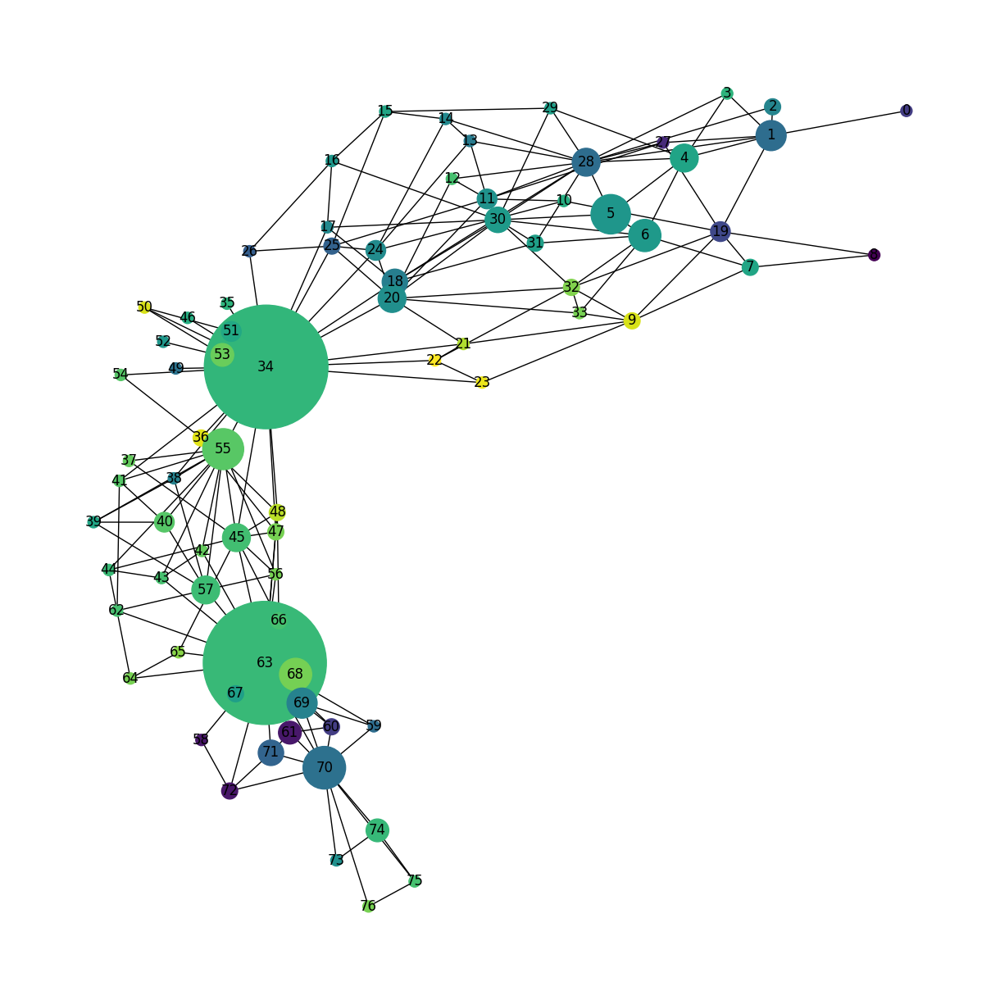

,Node,weight,num_nodes
0,0,1.860465,1
1,1,3.255814,7
2,2,4.069767,2
3,3,5.581395,1
4,4,5.077519,6
...,...,...,...
72,72,0.930233,2
73,73,4.418605,1
74,74,5.755814,4
75,75,6.046512,1


,Node1,Node2,weight,Resistance
0,0,1,4,1.250
1,1,19,2,3.250
2,1,2,12,1.125
3,1,27,2,1.750
4,1,3,4,1.500
...,...,...,...,...
180,70,71,8,1.250
181,71,72,2,1.250
182,73,74,2,1.250
183,74,75,2,1.250


Processing graph 2...


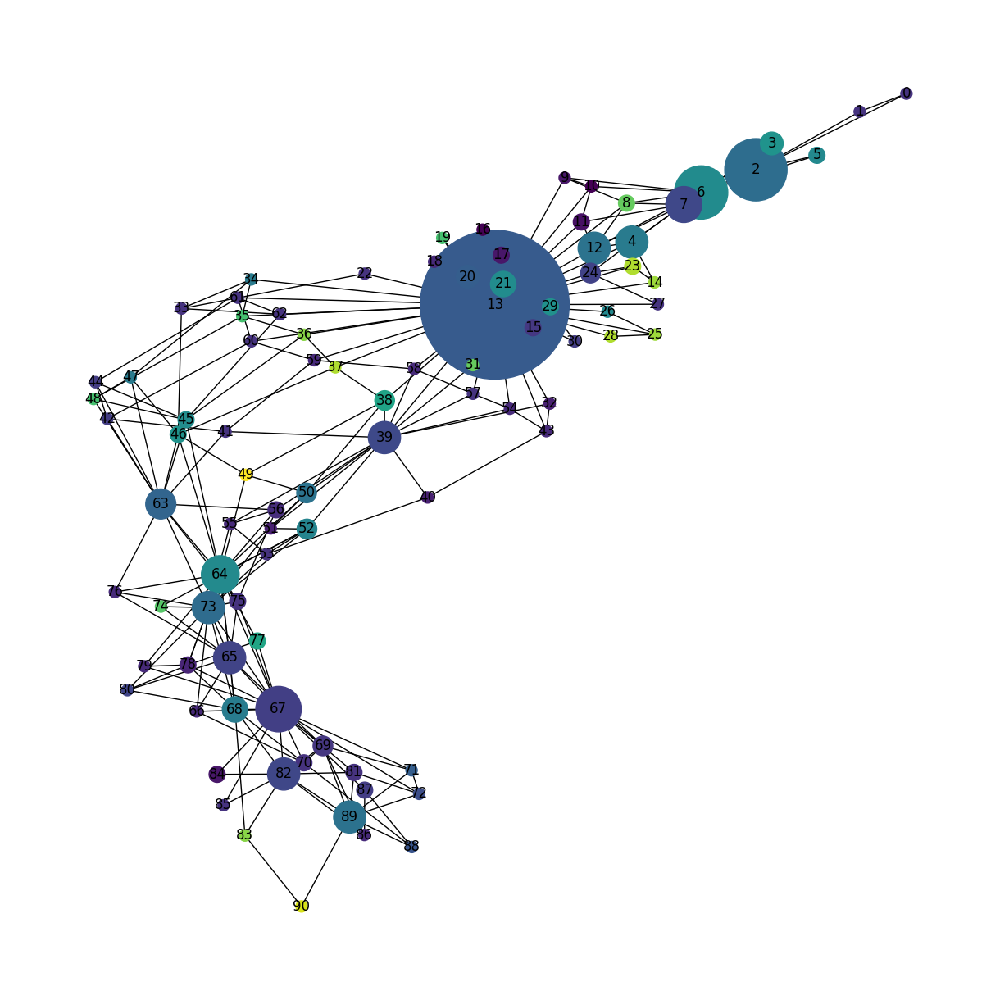

,Node,weight,num_nodes
0,0,2.325581,1
1,1,2.325581,1
2,2,3.953488,30
3,3,5.232558,4
4,4,4.418605,8
...,...,...,...
86,86,2.093023,1
87,87,2.558140,2
88,88,3.255814,1
89,89,4.127907,8


,Node1,Node2,weight,Resistance
0,0,1,2,1.000000
1,0,2,2,1.000000
2,1,2,4,1.000000
3,2,6,46,1.000000
4,2,3,12,1.133333
...,...,...,...,...
226,83,90,2,4.066667
227,86,87,2,1.133333
228,87,88,2,1.133333
229,88,89,2,1.000000


Processing graph 3...


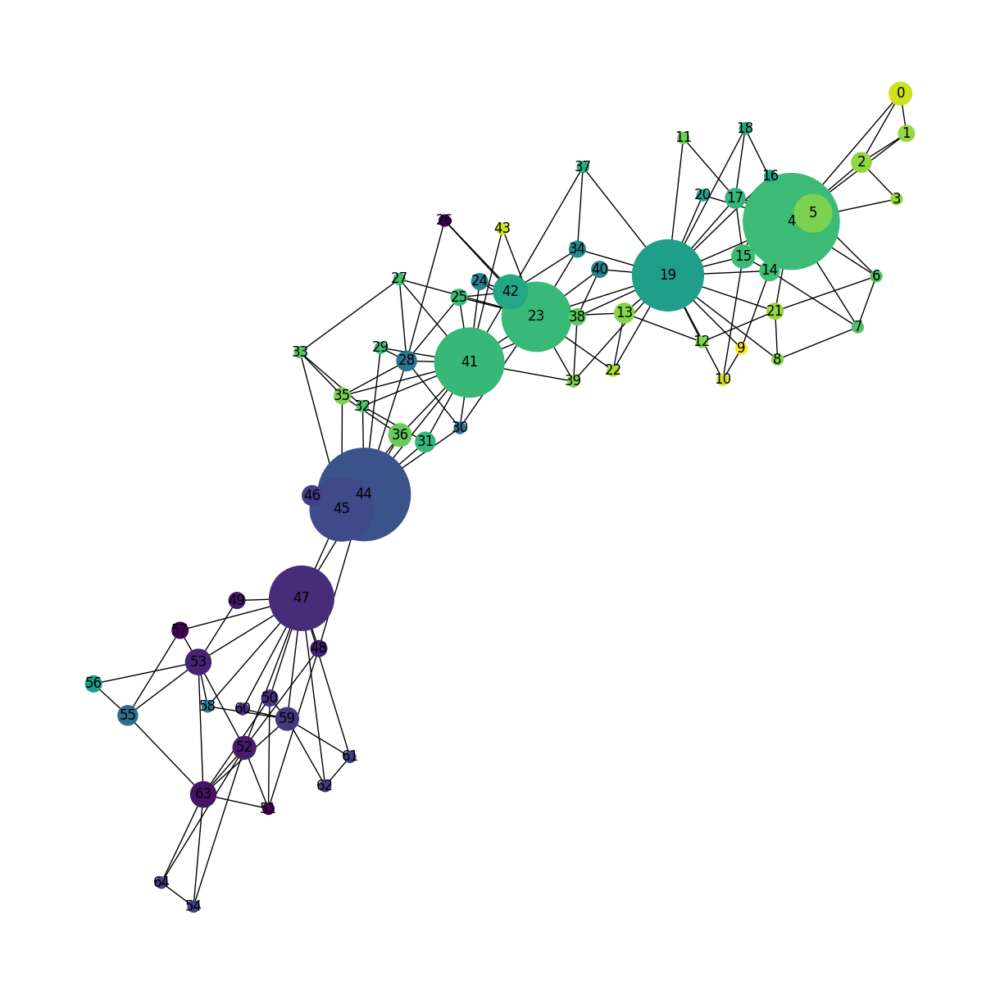

,Node,weight,num_nodes
0,0,8.333333,4
1,1,7.692308,2
2,2,7.606838,3
3,3,7.692308,1
4,4,6.366919,71
...,...,...,...
60,60,1.794872,1
61,61,2.307692,1
62,62,2.051282,1
63,63,1.179487,5


,Node1,Node2,weight,Resistance
0,0,1,6,2.333333
1,0,4,2,1.888889
2,0,2,2,1.222222
3,1,2,6,2.111111
4,1,4,2,1.444444
...,...,...,...,...
157,59,61,2,1.000000
158,59,62,2,2.111111
159,59,63,2,1.666667
160,61,62,2,2.111111


Processing graph 4...


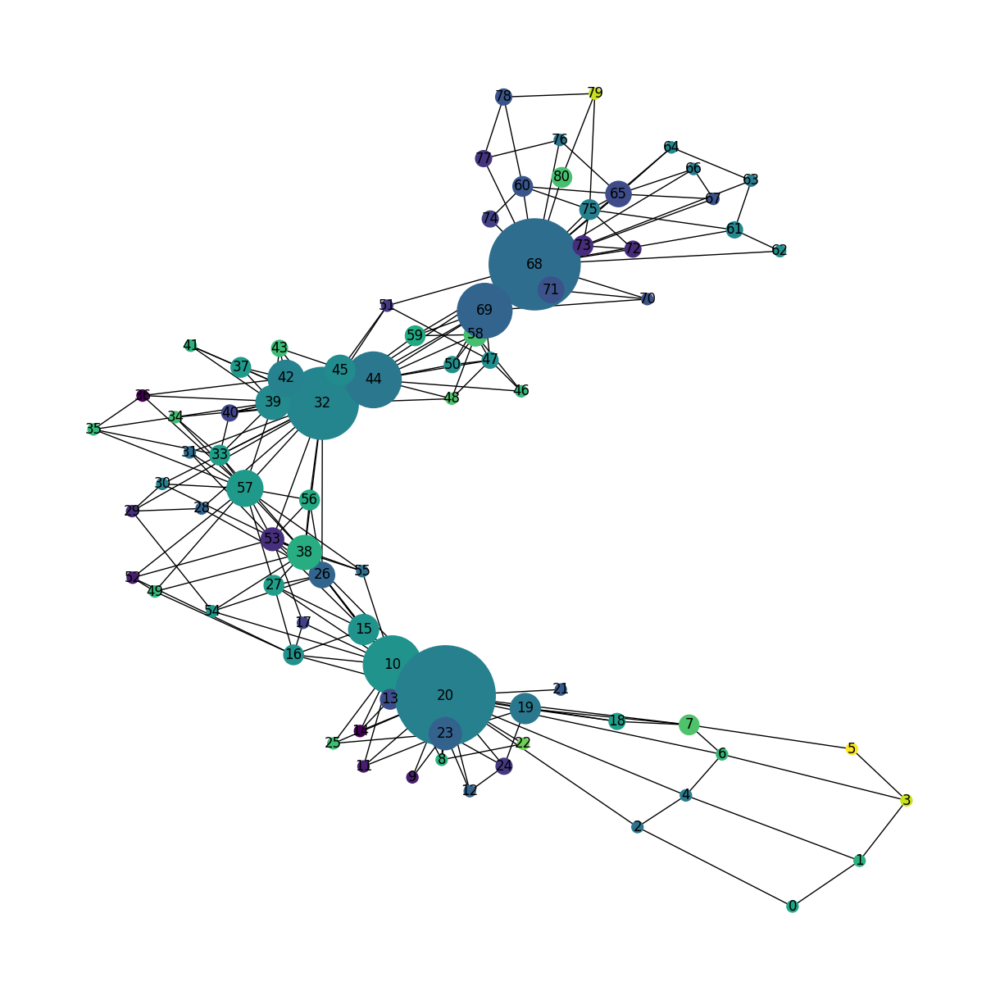

,Node,weight,num_nodes
0,0,3.859649,1
1,1,4.210526,1
2,2,2.631579,1
3,3,5.964912,1
4,4,2.807018,1
...,...,...,...
76,76,2.631579,1
77,77,1.140351,2
78,78,1.842105,2
79,79,5.964912,1


,Node1,Node2,weight,Resistance
0,0,1,2,1.190476
1,0,2,2,1.666667
2,1,3,2,1.952381
3,1,4,2,1.761905
4,2,4,2,1.095238
...,...,...,...,...
211,75,79,2,1.095238
212,76,77,2,1.095238
213,77,78,2,1.095238
214,78,79,2,1.380952


In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.cluster import DBSCAN
from sklearn import preprocessing
import numpy as np
import pandas as pd

def create_summary_graph(original_graph, encoded_spatial_labels):
    summary_graph = nx.Graph()

    node_to_index = {node: index for index, node in enumerate(original_graph.nodes)}

    for cluster_id in set(encoded_spatial_labels):
        nodes_in_cluster = [node for node, label in zip(original_graph.nodes(), encoded_spatial_labels) if label == cluster_id]

        avg_weight = np.mean([original_graph.nodes[node]['weight'] for node in nodes_in_cluster])
        num_nodes = len(nodes_in_cluster)

        summary_graph.add_node(cluster_id, weight=avg_weight, num_nodes=num_nodes)

    for node1, node2 in original_graph.edges():
        node1_cluster = encoded_spatial_labels[node_to_index[node1]]
        node2_cluster = encoded_spatial_labels[node_to_index[node2]]

        if node1_cluster != node2_cluster:
            if (node1_cluster, node2_cluster) not in summary_graph.edges():
                summary_graph.add_edge(node1_cluster, node2_cluster, weight=0)

            summary_graph.edges[node1_cluster, node2_cluster]['weight'] += 1

    return summary_graph, node_to_index


def spatial_cluster_and_plot_graph(graph):
    node_positions = nx.get_node_attributes(graph, 'pos')
    weights = nx.get_node_attributes(graph, 'weight')

    thresholds = [0, 2, 4, 6, 8, 10]
    labels = np.digitize(list(weights.values()), bins=thresholds, right=True)

    spatial_labels = []

    for cluster_id in set(labels):
        cluster_positions = [node_positions[node] for node, weight in weights.items() if np.digitize(weight, bins=thresholds, right=True) == cluster_id]
        dbscan = DBSCAN(eps=1, min_samples=1)
        dbscan.fit(cluster_positions)
        spatial_labels.extend([f"{cluster_id}_{label}" for label in dbscan.labels_])

    le = preprocessing.LabelEncoder()
    encoded_spatial_labels = le.fit_transform(spatial_labels)

    return encoded_spatial_labels


def compute_resistance(summary_graph, original_graph, node_to_label):
    for edge in summary_graph.edges():
        nodes_in_cluster1 = [node for node, label in node_to_label.items() if label == edge[0]]
        nodes_in_cluster2 = [node for node, label in node_to_label.items() if label == edge[1]]

        weights_in_cluster1 = [original_graph.nodes[node]['weight'] for node in nodes_in_cluster1]
        weights_in_cluster2 = [original_graph.nodes[node]['weight'] for node in nodes_in_cluster2]

        weight_diffs = [abs(w1 - w2) for w1 in weights_in_cluster1 for w2 in weights_in_cluster2]

        average_diff = np.mean(weight_diffs)
        summary_graph.edges[edge]['Resistance'] = average_diff

    resistance_values = [data['Resistance'] for _, _, data in summary_graph.edges(data=True)]
    min_resistance = min(resistance_values)
    max_resistance = max(resistance_values)

    for node1, node2, data in summary_graph.edges(data=True):
        rescaled_resistance = 1 + 4 * (data['Resistance'] - min_resistance) / (max_resistance - min_resistance)
        data['Resistance'] = rescaled_resistance

    return summary_graph

def create_node_dataframe(graph):
    node_data = graph.nodes(data=True)
    df_node = pd.DataFrame.from_records([{"Node": n, **d} for n, d in node_data])
    return df_node

def create_edge_dataframe(graph):
    edge_data = graph.edges(data=True)
    df_edge = pd.DataFrame.from_records([{"Node1": n1, "Node2": n2, **d} for n1, n2, d in edge_data])
    return df_edge

# Run your code
for i, graph in enumerate(my_graphs):
    print(f"Processing graph {i+1}...")

    encoded_spatial_labels = spatial_cluster_and_plot_graph(graph)
    summary_graph, node_to_label = create_summary_graph(graph, encoded_spatial_labels)
    summary_graph = compute_resistance(summary_graph, graph, node_to_label)

    df_node = create_node_dataframe(summary_graph)
    df_edge = create_edge_dataframe(summary_graph)

    df_node.to_csv(f'node_data_{i+1}.csv')
    df_edge.to_csv(f'edge_data_{i+1}.csv')

    # Adjust the figure size here before plotting
    plt.figure(figsize=(12, 12))

    # Define node colors and sizes
    node_colors = [summary_graph.nodes[n]['weight'] for n in summary_graph.nodes]
    node_sizes = [summary_graph.nodes[n]['num_nodes']*100 for n in summary_graph.nodes]

    nx.draw(summary_graph, with_labels=True, node_color=node_colors, node_size=node_sizes, cmap=plt.cm.viridis)

    plt.show()

    display(df_node)
    display(df_edge)


Processing graph 1...


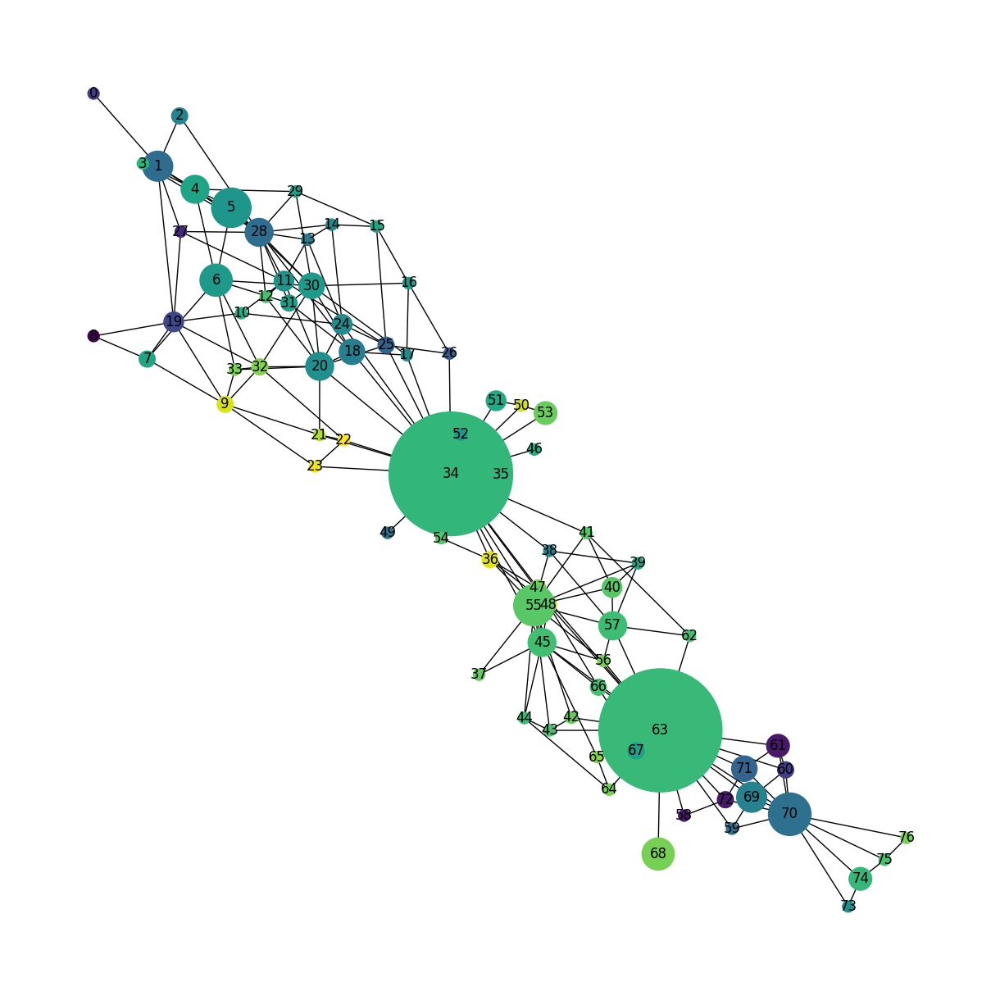

,Node,weight,num_nodes,Betweenness,Degree,Closeness,Eigenvector,PageRank,Clustering
0,0,1.860465,1,0.000000,0.013158,0.122878,0.004249,0.007574,0.000000
1,1,3.255814,7,0.033509,0.092105,0.144831,0.025989,0.024631,0.285714
2,2,4.069767,2,0.000000,0.026316,0.140839,0.013171,0.006950,1.000000
3,3,5.581395,1,0.000000,0.039474,0.147860,0.017541,0.008142,1.000000
4,4,5.077519,6,0.010877,0.078947,0.154983,0.029222,0.014383,0.400000
...,...,...,...,...,...,...,...,...,...
72,72,0.930233,2,0.000000,0.052632,0.178509,0.046877,0.022498,0.666667
73,73,4.418605,1,0.000000,0.026316,0.149020,0.010502,0.007798,1.000000
74,74,5.755814,4,0.000439,0.039474,0.155340,0.013349,0.011692,0.666667
75,75,6.046512,1,0.000439,0.039474,0.149754,0.011781,0.010674,0.666667


,Node1,Node2,weight,Resistance
0,0,1,0.800000,1.250
1,1,19,0.307692,3.250
2,1,2,0.888889,1.125
3,1,27,0.571429,1.750
4,1,3,0.666667,1.500
...,...,...,...,...
180,70,71,0.800000,1.250
181,71,72,0.800000,1.250
182,73,74,0.800000,1.250
183,74,75,0.800000,1.250


Processing graph 2...


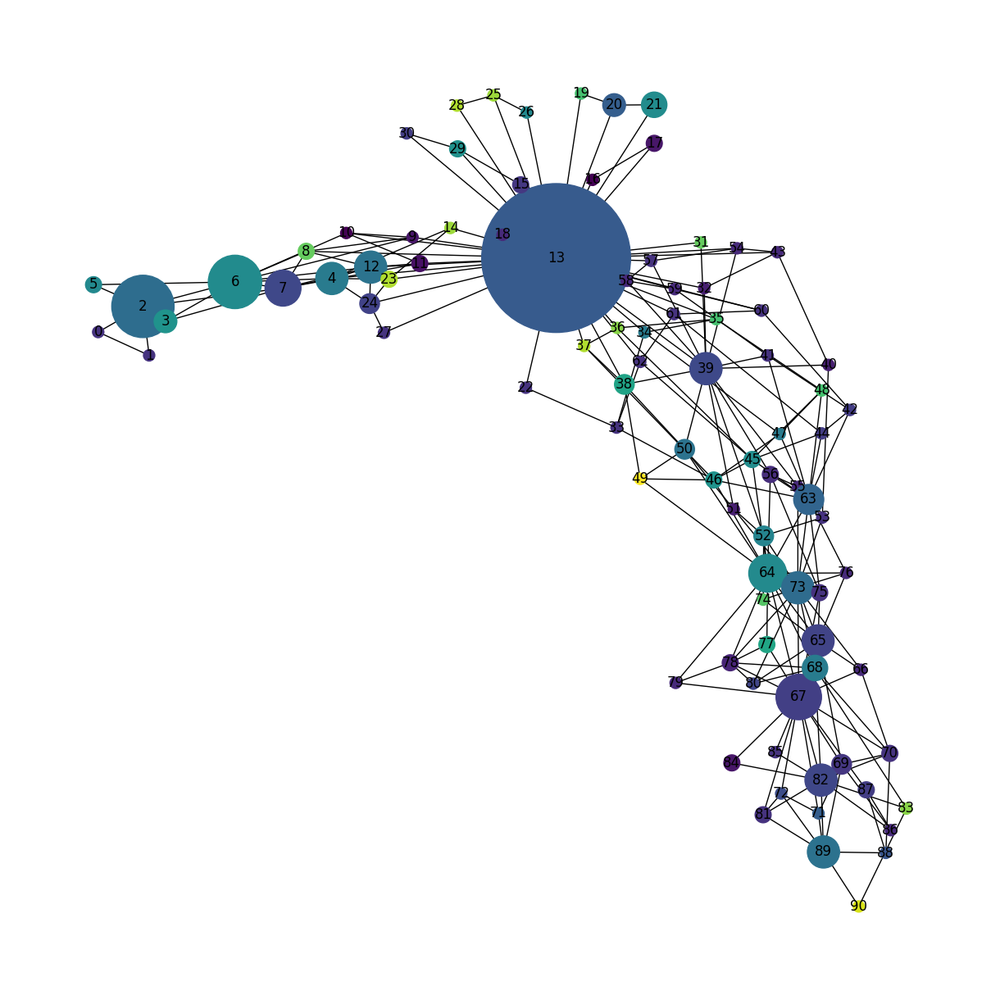

,Node,weight,num_nodes,Betweenness,Degree,Closeness,Eigenvector,PageRank,Clustering
0,0,2.325581,1,0.000000,0.022222,0.090507,0.000143,0.009149,1.000000
1,1,2.325581,1,0.000000,0.022222,0.090507,0.000143,0.009149,1.000000
2,2,3.953488,30,0.044268,0.066667,0.099294,0.000621,0.017719,0.333333
3,3,5.232558,4,0.000000,0.033333,0.099919,0.000520,0.007490,1.000000
4,4,4.418605,8,0.026750,0.077778,0.119142,0.002647,0.013258,0.476190
...,...,...,...,...,...,...,...,...,...
86,86,2.093023,1,0.000375,0.033333,0.117504,0.019312,0.007871,0.333333
87,87,2.558140,2,0.040449,0.033333,0.133202,0.062813,0.011198,0.000000
88,88,3.255814,1,0.001436,0.033333,0.118090,0.016679,0.008659,0.000000
89,89,4.127907,8,0.023887,0.077778,0.112463,0.023572,0.014447,0.238095


,Node1,Node2,weight,Resistance
0,0,1,1.000000,1.000000
1,0,2,1.000000,1.000000
2,1,2,1.000000,1.000000
3,2,6,1.000000,1.000000
4,2,3,0.882353,1.133333
...,...,...,...,...
226,83,90,0.245902,4.066667
227,86,87,0.882353,1.133333
228,87,88,0.882353,1.133333
229,88,89,1.000000,1.000000


Processing graph 3...


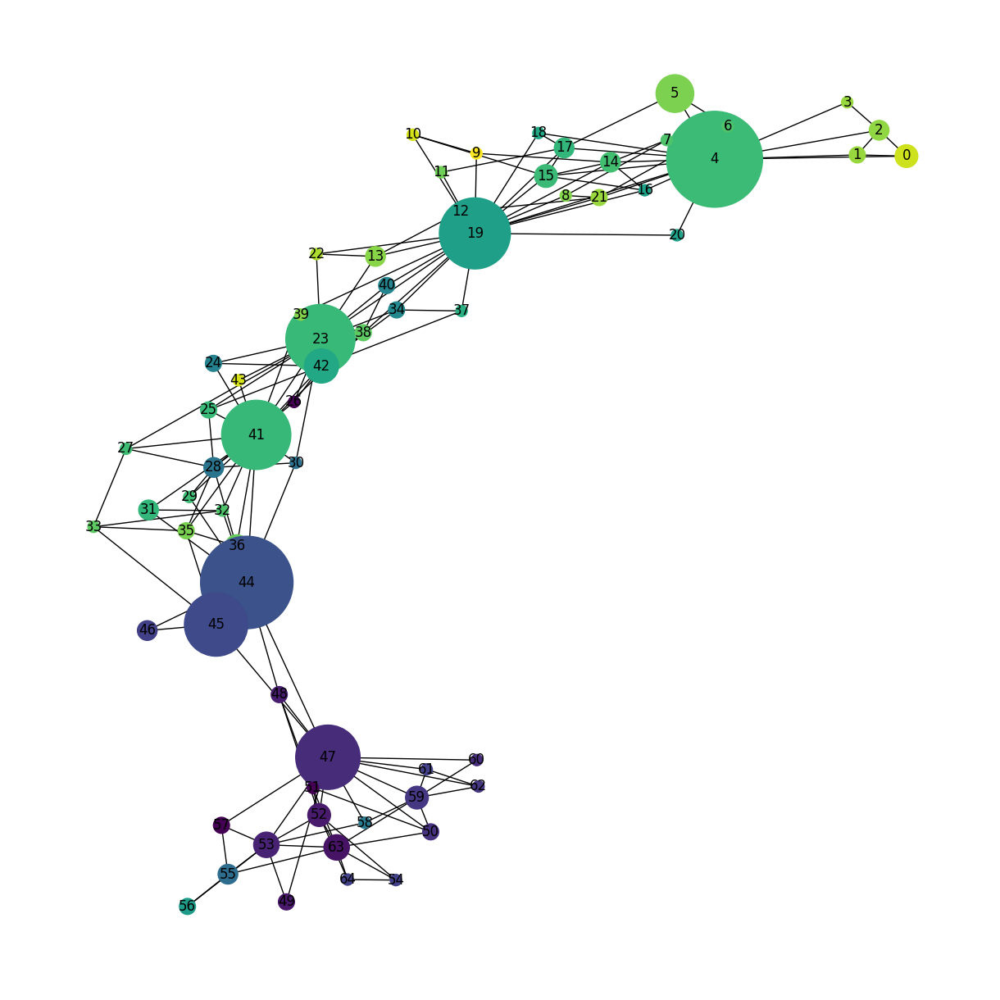

,Node,weight,num_nodes,Betweenness,Degree,Closeness,Eigenvector,PageRank,Clustering
0,0,8.333333,4,0.000000,0.046875,0.126788,0.028273,0.005266,1.000000
1,1,7.692308,2,0.000000,0.046875,0.133860,0.031388,0.004828,1.000000
2,2,7.606838,3,0.000248,0.062500,0.130672,0.032737,0.006851,0.666667
3,3,7.692308,1,0.000000,0.031250,0.129788,0.024988,0.003422,1.000000
4,4,6.366919,71,0.148479,0.234375,0.164477,0.163008,0.021638,0.200000
...,...,...,...,...,...,...,...,...,...
60,60,1.794872,1,0.000000,0.031250,0.127801,0.002119,0.013791,1.000000
61,61,2.307692,1,0.000000,0.046875,0.135657,0.003119,0.020746,1.000000
62,62,2.051282,1,0.000000,0.046875,0.129964,0.002438,0.015948,1.000000
63,63,1.179487,5,0.024946,0.125000,0.138896,0.004648,0.054635,0.285714


,Node1,Node2,weight,Resistance
0,0,1,0.428571,2.333333
1,0,4,0.529412,1.888889
2,0,2,0.818182,1.222222
3,1,2,0.473684,2.111111
4,1,4,0.692308,1.444444
...,...,...,...,...
157,59,61,1.000000,1.000000
158,59,62,0.473684,2.111111
159,59,63,0.600000,1.666667
160,61,62,0.473684,2.111111


Processing graph 4...


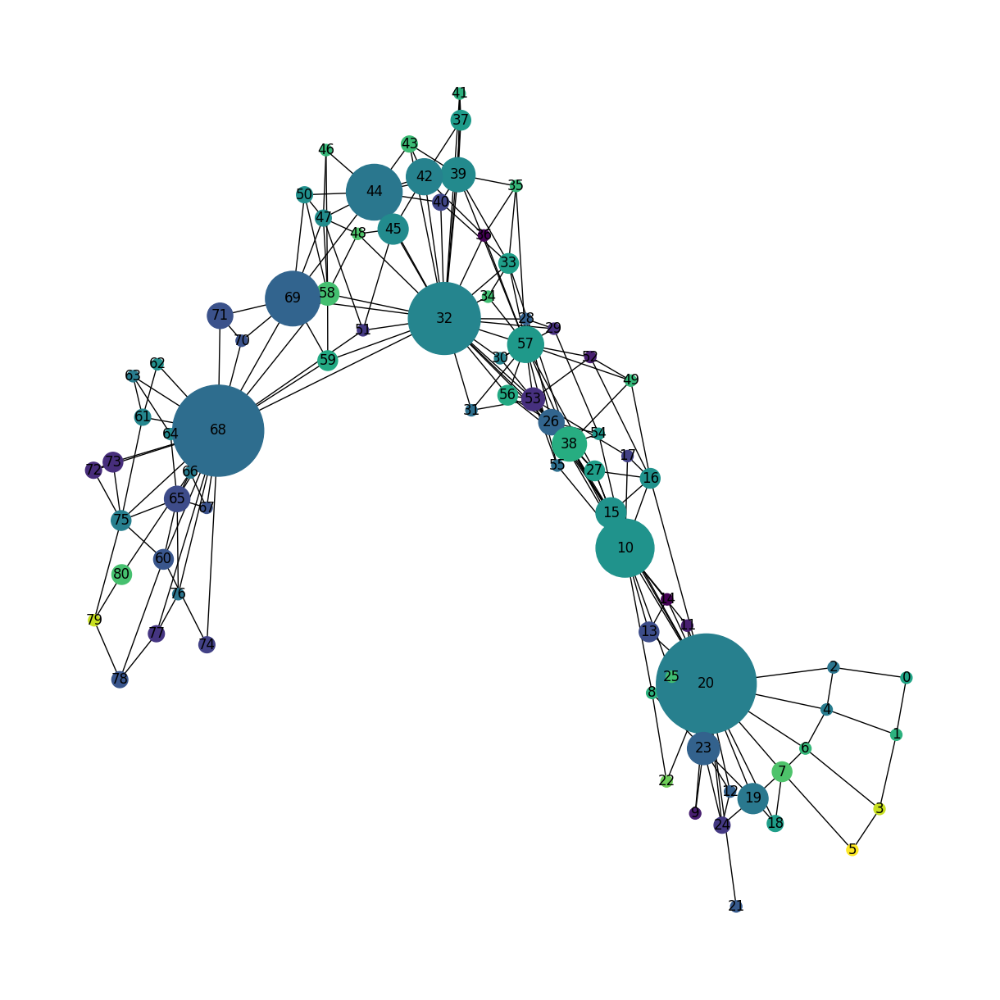

,Node,weight,num_nodes,Betweenness,Degree,Closeness,Eigenvector,PageRank,Clustering
0,0,3.859649,1,0.000264,0.0250,0.103118,0.001854,0.005491,0.000000
1,1,4.210526,1,0.001108,0.0375,0.103621,0.002264,0.006822,0.000000
2,2,2.631579,1,0.024051,0.0375,0.122413,0.012010,0.007844,0.333333
3,3,5.964912,1,0.001319,0.0375,0.111873,0.002974,0.006022,0.000000
4,4,2.807018,1,0.024420,0.0500,0.124334,0.014159,0.009475,0.333333
...,...,...,...,...,...,...,...,...,...
76,76,2.631579,1,0.000316,0.0375,0.112254,0.007718,0.007236,0.666667
77,77,1.140351,2,0.013528,0.0375,0.112277,0.006548,0.011198,0.333333
78,78,1.842105,2,0.004114,0.0375,0.102377,0.002785,0.009705,0.000000
79,79,5.964912,1,0.005696,0.0375,0.106599,0.003751,0.009830,0.000000


,Node1,Node2,weight,Resistance
0,0,1,0.840000,1.190476
1,0,2,0.600000,1.666667
2,1,3,0.512195,1.952381
3,1,4,0.567568,1.761905
4,2,4,0.913043,1.095238
...,...,...,...,...
211,75,79,0.913043,1.095238
212,76,77,0.913043,1.095238
213,77,78,0.913043,1.095238
214,78,79,0.724138,1.380952


In [ ]:
def create_node_dataframe(graph):
    node_data = graph.nodes(data=True)
    df_node = pd.DataFrame.from_records([{"Node": n, **d} for n, d in node_data])

    # Calculate centrality measures
    bet_cen = nx.betweenness_centrality(graph, weight='Resistance')
    deg_cen = nx.degree_centrality(graph)
    clo_cen = nx.closeness_centrality(graph, distance='Resistance')

    # Normalize the edge weights by resistance for eigenvector centrality
    for u, v, d in graph.edges(data=True):
        d['weight'] = 1 / d['Resistance']
    eig_cen = nx.eigenvector_centrality(graph, weight='weight')

    # Reverse the node weights for PageRank
    reversed_weights = {node: 1/data['weight'] for node, data in graph.nodes(data=True)}
    pag_ran = nx.pagerank(graph, personalization=reversed_weights)

    clus_cof = nx.clustering(graph)

    # Add the centrality measures to the dataframe
    df_node['Betweenness'] = df_node['Node'].map(bet_cen)
    df_node['Degree'] = df_node['Node'].map(deg_cen)
    df_node['Closeness'] = df_node['Node'].map(clo_cen)
    df_node['Eigenvector'] = df_node['Node'].map(eig_cen)
    df_node['PageRank'] = df_node['Node'].map(pag_ran)
    df_node['Clustering'] = df_node['Node'].map(clus_cof)

    return df_node

# Run your code
for i, graph in enumerate(my_graphs):
    print(f"Processing graph {i+1}...")

    encoded_spatial_labels = spatial_cluster_and_plot_graph(graph)
    summary_graph, node_to_label = create_summary_graph(graph, encoded_spatial_labels)
    summary_graph = compute_resistance(summary_graph, graph, node_to_label)

    df_node = create_node_dataframe(summary_graph)
    df_edge = create_edge_dataframe(summary_graph)

    df_node.to_csv(f'node_data_{i+1}.csv')
    df_edge.to_csv(f'edge_data_{i+1}.csv')

    # Adjust the figure size here before plotting
    plt.figure(figsize=(12, 12))

    # Define node colors and sizes
    node_colors = [summary_graph.nodes[n]['weight'] for n in summary_graph.nodes]
    node_sizes = [summary_graph.nodes[n]['num_nodes']*100 for n in summary_graph.nodes]

    nx.draw(summary_graph, with_labels=True, node_color=node_colors, node_size=node_sizes, cmap=plt.cm.viridis)

    plt.show()

    display(df_node)
    display(df_edge)


# save_to_csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

google_drive_path = '/content/drive/MyDrive/GraphML_Satellite_Australia/CSVs_TEST'  # Replace 'your_folder' with the actual folder name

# Run your code
for i, graph in enumerate(my_graphs):
    print(f"Processing graph {i+1}...")

    encoded_spatial_labels = spatial_cluster_and_plot_graph(graph)
    summary_graph, node_to_label = create_summary_graph(graph, encoded_spatial_labels)
    summary_graph = compute_resistance(summary_graph, graph, node_to_label)

    df_node = create_node_dataframe(summary_graph)
    df_edge = create_edge_dataframe(summary_graph)

    # Save data frames to Google Drive with proper naming
    df_node.to_csv(f'{google_drive_path}/node_data_{i+1}.csv', index=False)
    df_edge.to_csv(f'{google_drive_path}/edge_data_{i+1}.csv', index=False)


# style_plots_for_final_pres

In [ ]:
def plot_summary_graphs(my_graphs):
    # Iterate over your list of graphs
    for i, graph in enumerate(my_graphs):
        print(f"Plotting graph {i+1}...")

        encoded_spatial_labels = spatial_cluster_and_plot_graph(graph)
        summary_graph, node_to_label = create_summary_graph(graph, encoded_spatial_labels)
        summary_graph = compute_resistance(summary_graph, graph, node_to_label)

        # Create a spring layout to minimize node overlap
        pos = nx.spring_layout(summary_graph)

        # Define the figure size for the plot
        plt.figure(figsize=(12, 12))

        # Define node colors and sizes
        node_colors = [summary_graph.nodes[n]['weight'] for n in summary_graph.nodes]
        node_sizes = [summary_graph.nodes[n]['num_nodes']*120 for n in summary_graph.nodes]  # sizes increased by 1.2x

        nx.draw(summary_graph, pos, with_labels=True, node_color=node_colors, node_size=node_sizes, cmap=plt.cm.viridis, font_color='white')

        plt.show()

plot_summary_graphs(my_graphs)


In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import networkx as nx

def get_color(weight, attribute='weight'):
    if attribute == 'weight':
        if weight < 2:
            normalized_weight = 0.0
        elif weight >= 2 and weight < 5:
            normalized_weight = 0.25
        elif weight >= 5 and weight < 10:
            normalized_weight = 0.5
        elif weight >= 10 and weight < 50:
            normalized_weight = 0.75
        else:
            normalized_weight = 1.0
    elif attribute == 'Resistance':
        normalized_weight = (weight - 1) / 4  # Assuming resistance values range from 1 to 5
    return plt.cm.viridis(normalized_weight)

def plot_circular_graph(graph, attribute='weight'):
    fig = plt.figure(figsize=(18, 15))  # Set the figure size

    pos = nx.circular_layout(graph)

    edge_weights = nx.get_edge_attributes(graph, attribute)
    node_weights = nx.get_node_attributes(graph, 'weight')
    node_colors = [weight for weight in node_weights.values()]

    nx.draw_networkx_nodes(graph, pos, node_color='black', node_size=400)
    nx.draw_networkx_labels(graph, pos, font_color='white')

    for edge, weight in edge_weights.items():
        color = get_color(weight, attribute)
        nx.draw_networkx_edges(graph, pos, edgelist=[edge], edge_color=color, connectionstyle='arc3,rad=0.2')

    plt.subplots_adjust(right=0.8)  # Adjust subplot for colorbar

    # Define a smaller subplot for the colorbar, reduce the size and move it to right
    colorbar_axis = fig.add_axes([0.85, 0.3, 0.02, 0.4])
    norm = mpl.colors.Normalize(vmin=0, vmax=1)
    cbar = mpl.colorbar.ColorbarBase(colorbar_axis, cmap=plt.get_cmap('viridis'), norm=norm, orientation='vertical')

    if attribute == 'weight':
        cbar.set_ticks([0, 0.25, 0.5, 0.75, 1])
        cbar.set_ticklabels(['<2', '2-5', '5-10', '10-50', '>50'])
    elif attribute == 'Resistance':
        cbar.set_ticks([0, 0.25, 0.5, 0.75, 1])
        cbar.set_ticklabels(['1', '2', '3', '4', '5'])

    cbar.ax.tick_params(labelsize=8)  # make the colorbar tick labels smaller

    plt.title(f'{attribute.capitalize()} Distribution')

    plt.show()

for i, graph in enumerate(my_graphs):
    print(f"Graph {i+1}:")
    encoded_spatial_labels = spatial_cluster_and_plot_graph(graph)
    summary_graph, node_to_label = create_summary_graph(graph, encoded_spatial_labels)
    summary_graph = compute_resistance(summary_graph, graph, node_to_label)

    # Plotting the summary graph
    plot_circular_graph(summary_graph, attribute='weight')
    plot_circular_graph(summary_graph, attribute='Resistance')

